In [1]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
Asset_PATH = "/home/zhimin90/DePaul/CSC695/Github/CSC695-Masters-Research-on-Neural-Network-Time-Series-Attention-Models/Asset/"

#### Timeseries windowing function

In [3]:
def window_stack(a, stepsize=1, width=52):
    n = a.shape[0]
    return np.hstack( a[i:1+n+i-width:stepsize] for i in range(0,width) )

#### Window size

In [4]:
timesteps = 52

#### Load Gaussian KDE timeseries

In [5]:
density_matrix_t_series = pickle.load(open(Asset_PATH  + 'density_matrix_t_series_25x25.pickle', 'rb'))

In [6]:
density_matrix_t_series.shape

(1011, 25, 25)

In [7]:
print(np.max(density_matrix_t_series))
print(np.min(density_matrix_t_series))

7464.852345565599
2.220446049250313e-16


In [8]:
flattened_matrix_np = np.reshape(density_matrix_t_series, 
                                 (density_matrix_t_series.shape[0],
                                  density_matrix_t_series.shape[1]*density_matrix_t_series.shape[2]))
flattened_matrix_np.shape

(1011, 625)

In [9]:
stacked = window_stack(flattened_matrix_np,1,timesteps)

/home/zhimin90/anaconda3/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  This is separate from the ipykernel package so we can avoid doing imports until


In [10]:
stacked.shape

(960, 32500)

In [11]:
train, valid = (60,20)
test = 20

total_len = stacked.shape[0]
train_index = range(0,int(train/100*total_len))

valid_index = range(train_index[-1]+1,train_index[-1] + int(valid/100*total_len))
test_index = range(valid_index[-1]+1,valid_index[-1] + int(test/100*total_len))

In [12]:
train_index, valid_index, test_index

(range(0, 576), range(576, 767), range(767, 958))

#### MinMax Scaler

In [13]:
scaler_max = np.max(stacked[train_index])
scaler_min = np.min(stacked[train_index])

#### We transform the whole train, valid, test based on scaler fitted on train

In [14]:
np.max(flattened_matrix_np)

7464.852345565599

In [15]:
scaled_flattened_matrix = (stacked - scaler_min)/(scaler_max - scaler_min)

In [16]:
scaled_flattened_matrix.shape

(960, 32500)

In [17]:
print(np.max(scaled_flattened_matrix))
print(np.min(scaled_flattened_matrix))

1.7283221574388663
0.0


In [18]:
scaled_flattened_matrix.shape

(960, 32500)

In [19]:
reshape_stack = scaled_flattened_matrix.reshape(scaled_flattened_matrix.shape[0],timesteps,
                                int((scaled_flattened_matrix.shape[1]/timesteps)**(1/2)),
                                int((scaled_flattened_matrix.shape[1]/timesteps)**(1/2)),1)

In [20]:
reshape_stack.shape

(960, 52, 25, 25, 1)

#### We reshape to (sample, timestep, inputshape)

In [21]:
scaled_flattened_matrix = reshape_stack
scaled_flattened_matrix.shape

(960, 52, 25, 25, 1)

#### We set the target to be 7 days aggregated KDE or 1 single frame forward

In [22]:
X_train = scaled_flattened_matrix[np.array(train_index)]
Y_train = scaled_flattened_matrix[np.array(train_index)+1][:,-1,:]
Y_train = Y_train.reshape(Y_train.shape[0],int(Y_train.shape[1]*Y_train.shape[2]*Y_train.shape[3]))

In [23]:
X_valid = scaled_flattened_matrix[np.array(valid_index)]
Y_valid = scaled_flattened_matrix[np.array(valid_index)+1][:,-1,:]
Y_valid = Y_valid.reshape(Y_valid.shape[0],int(Y_valid.shape[1]*Y_valid.shape[2]*Y_valid.shape[3]))

In [24]:
X_test = scaled_flattened_matrix[np.array(test_index)]
Y_test = scaled_flattened_matrix[np.array(test_index)+1][:,-1,:]
Y_test = Y_test.reshape(Y_test.shape[0],int(Y_test.shape[1]*Y_test.shape[2]*Y_test.shape[3]))

In [25]:
print(X_train.shape)
print(Y_train.shape)
print(X_valid.shape)
print(Y_valid.shape)
print(X_test.shape)
print(Y_test.shape)

(576, 52, 25, 25, 1)
(576, 625)
(191, 52, 25, 25, 1)
(191, 625)
(191, 52, 25, 25, 1)
(191, 625)


In [26]:
np.max(X_train)

1.0

In [27]:
np.max(X_valid)

1.345068053156236

In [28]:
np.max(X_test)

1.7283221574388663

In [29]:
import os, datetime
import tensorflow as tf
from tensorflow.keras import optimizers
import tensorflow.keras.layers as layers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, LSTM, Bidirectional, GaussianNoise, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Concatenate, Input, LSTM, GRU, RepeatVector, TimeDistributed
from tensorflow.keras.layers import concatenate, Activation, Permute, Multiply, Lambda, Reshape, LeakyReLU, Attention
from tensorflow.keras import backend as K


In [30]:
checkpoint_filepath = Asset_PATH+'checkpoints/'
print(checkpoint_filepath)

/home/zhimin90/DePaul/CSC695/Github/CSC695-Masters-Research-on-Neural-Network-Time-Series-Attention-Models/Asset/checkpoints/


## Fully connected Model

In [62]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))
   
timeDist = TimeDistributed(Flatten())(inputs)

Dense1 = Dense(100, kernel_initializer='glorot_normal', activation='relu')(timeDist)
Dense2 = Dense(100, kernel_initializer='glorot_normal', activation='relu')(Dense1)
Dense3 = Dense(Y_train.shape[1])(Flatten()(Dense2))
outputs = Dense3

model = Model(inputs, outputs, name="Flattened_Fully_Connected")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)

Model: "Flattened_Fully_Connected"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, 52, 25, 25, 1)]   0         
_________________________________________________________________
time_distributed_19 (TimeDis (None, 52, 625)           0         
_________________________________________________________________
dense_37 (Dense)             (None, 52, 100)           62600     
_________________________________________________________________
dense_38 (Dense)             (None, 52, 100)           10100     
_________________________________________________________________
flatten_24 (Flatten)         (None, 5200)              0         
_________________________________________________________________
dense_39 (Dense)             (None, 625)               3250625   
Total params: 3,323,325
Trainable params: 3,323,325
Non-trainable params: 0
_______________________________

## Flattened LSTM Model

In [169]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

    
timeDist = TimeDistributed(Flatten())(inputs)

LSTM_layer1 = LSTM(1000, return_sequences=True)(timeDist)
LSTM_layer2 = LSTM(1000, return_sequences=True)(LSTM_layer1)
LSTM_layer3 = LSTM(1000)(LSTM_layer2)
#Dense1 = Dense(1000, kernel_initializer='glorot_normal', activation='relu')(LSTM_layer2)
Dense2 = Dense(Y_train.shape[1])(LSTM_layer3)
outputs = Dense2

model = Model(inputs, outputs, name="Flattened_LTSM")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)



Model: "Flattened_LTSM"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_68 (InputLayer)        [(None, 52, 25, 25, 1)]   0         
_________________________________________________________________
time_distributed_122 (TimeDi (None, 52, 625)           0         
_________________________________________________________________
lstm_26 (LSTM)               (None, 52, 1000)          6504000   
_________________________________________________________________
lstm_27 (LSTM)               (None, 52, 1000)          8004000   
_________________________________________________________________
lstm_28 (LSTM)               (None, 1000)              8004000   
_________________________________________________________________
dense_249 (Dense)            (None, 625)               625625    
Total params: 23,137,625
Trainable params: 23,137,625
Non-trainable params: 0
________________________________________

## 2D CNN LSTM

In [67]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
batch = 48
lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

cnn1 = Conv2D(20, (1,1), activation='relu', padding='same')
TD = TimeDistributed(cnn1)(inputs)

cnn2 = Conv2D(20, (1,1), activation='relu', padding='same')
TD2 = TimeDistributed(cnn2)(TD)

TD3 = TimeDistributed(
        MaxPooling2D(pool_size=(2, 2)))(TD2)
    
timeDist = TimeDistributed(Flatten())(TD3)

cnn4 = Conv2D(20, (1,1), activation='relu', padding='same')
TD4 = TimeDistributed(cnn4)(TD3)

cnn5 = Conv2D(20, (1,1), activation='relu', padding='same')
TD5 = TimeDistributed(cnn5)(TD4)

TD6 = TimeDistributed(
        MaxPooling2D(pool_size=(2, 2)))(TD5)
    
timeDist2 = TimeDistributed(Flatten())(TD6)

merge = concatenate([timeDist, timeDist2])

LSTM_layer1 = LSTM(1000)(merge)
Dense1 = Dense(1000, kernel_initializer='glorot_normal', activation='relu')(LSTM_layer1)
Dense2 = Dense(Y_train.shape[1])(Flatten()(Dense1))
outputs = Dense2

model = Model(inputs, outputs, name="2DCNN_LTSM")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


Model: "2DCNN_LTSM"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_12 (InputLayer)           [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_21 (TimeDistri (None, 52, 25, 25, 2 40          input_12[0][0]                   
__________________________________________________________________________________________________
time_distributed_22 (TimeDistri (None, 52, 25, 25, 2 420         time_distributed_21[0][0]        
__________________________________________________________________________________________________
time_distributed_23 (TimeDistri (None, 52, 12, 12, 2 0           time_distributed_22[0][0]        
_________________________________________________________________________________________

## Flatten LSTM + Attention

In [70]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

#send both convolved layer and flattened layer into LSTM
timeDist = TimeDistributed(Flatten())(inputs)
#diffTime = Lambda(lambda x: x[:,:-1,:]-x[:,1:,:],name='timestep_diff')(timeDist3)
units = 1000
LSTM_layer1 = LSTM(units, return_sequences=True)(timeDist)
LSTM_layer2 = LSTM(units, return_sequences=True)(LSTM_layer1)
LSTM_layer3 = LSTM(units, return_sequences=True)(LSTM_layer2)

attention = Dense(units, activation='tanh')(LSTM_layer3) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)

sent_representation = Multiply()([LSTM_layer3, attention])
attended_LSTM_out = Lambda(lambda x : K.sum(x, axis=1))(sent_representation) ## this line
D_temp = Dense(units*2, activation='relu')(attended_LSTM_out) # hidden layer

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(D_temp)
outputs = Dense2

model = Model(inputs, outputs, name="FLATTENED_LTSM_Attention")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)

Model: "FLATTENED_LTSM_Attention"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_29 (TimeDistri (None, 52, 625)      0           input_13[0][0]                   
__________________________________________________________________________________________________
lstm_11 (LSTM)                  (None, 52, 1000)     6504000     time_distributed_29[0][0]        
__________________________________________________________________________________________________
lstm_12 (LSTM)                  (None, 52, 1000)     8004000     lstm_11[0][0]                    
___________________________________________________________________________

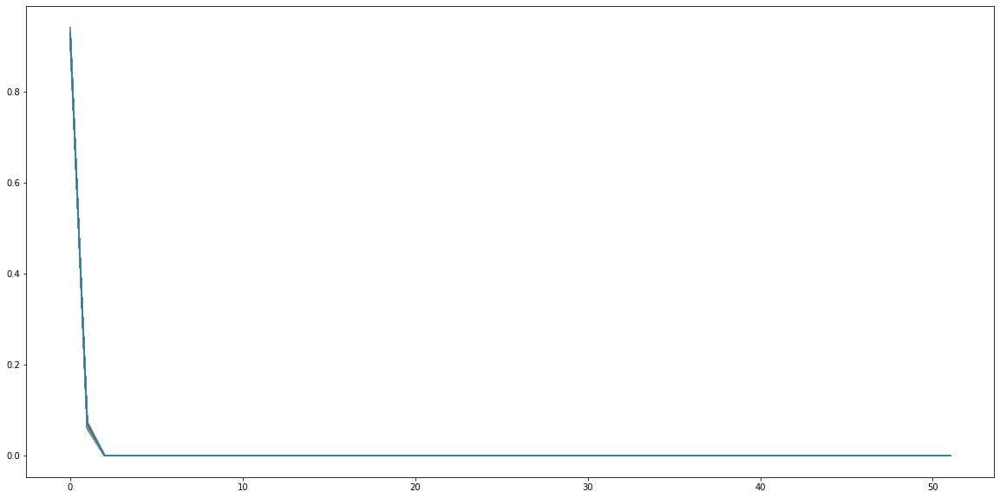

In [58]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

## Attention on flattened inputs 

In [105]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

timeDist = TimeDistributed(Flatten())(inputs)
units = timeDist.shape[2]
# compute importance for each step
attention = Dense(units, activation='tanh')(timeDist) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
sent_representation = Multiply()([timeDist, attention])

attended_out = Lambda(lambda x : K.sum(x, axis=1))(sent_representation) ## this line
D_temp = Dense(units*2, activation='relu')(attended_out) # hidden layer

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(D_temp)
outputs = Dense2

model = Model(inputs, outputs, name="Flattened_Attention_Time")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


Model: "Flattened_Attention_Time"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_34 (InputLayer)           [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_62 (TimeDistri (None, 52, 625)      0           input_34[0][0]                   
__________________________________________________________________________________________________
dense_129 (Dense)               (None, 52, 625)      391250      time_distributed_62[0][0]        
__________________________________________________________________________________________________
dense_130 (Dense)               (None, 52, 1)        626         dense_129[0][0]                  
___________________________________________________________________________

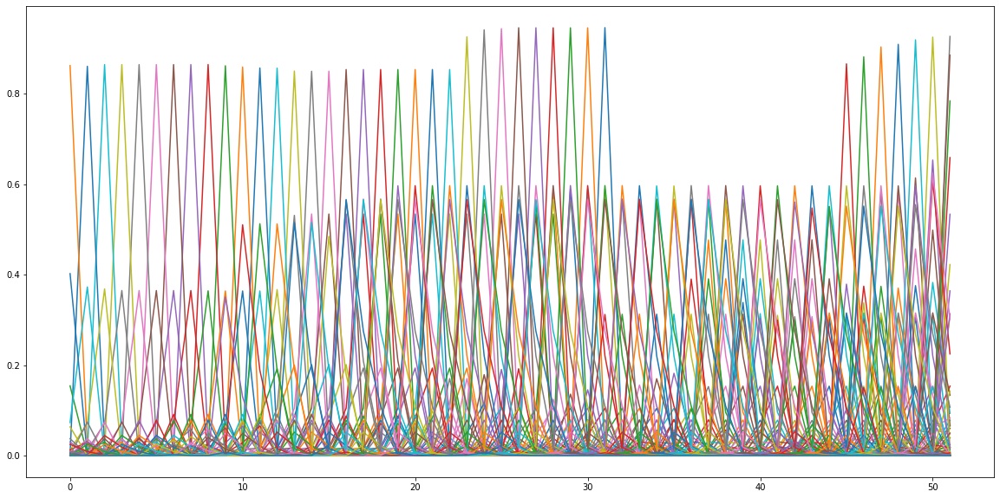

In [109]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

# Frequency from FFT + Attention

In [120]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

#Frequency Head
timeDist = TimeDistributed(Flatten())(inputs)
timeDist = Permute([2, 1])(timeDist) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist.shape',timeDist.shape)
fftLayer = Lambda(lambda x : tf.math.abs(tf.signal.rfft(x)))(timeDist) ## transform to frequency domain with TF
fftLayer  = Permute([2, 1], name="fft_out")(fftLayer)#transpose back for the following shape
print('fftLayer.shape',fftLayer.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
#timeDist4 = TimeDistributed(Dense(100))(fftLayer)
units = fftLayer.shape[2]

# compute importance for each frequency
attention = Dense(units, activation='tanh')(fftLayer) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
sent_representation = Multiply()([fftLayer, attention])

print(sent_representation.shape)
attended_out = Lambda(lambda x : K.sum(x, axis=1))(sent_representation) ## this line
D_temp = Dense(units*2, activation='relu')(attended_out) # hidden layer

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(D_temp)
outputs = Dense2


model = Model(inputs, outputs, name="Attention_FFT")
model.summary()

adam = optimizers.Adam(lr)
#rmsProp = optimizers.RMSprop(learning_rate=lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


timeDist.shape (None, 625, 52)
fftLayer.shape (None, 27, 625)
(None, 27, 625)
Model: "Attention_FFT"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_39 (InputLayer)           [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_77 (TimeDistri (None, 52, 625)      0           input_39[0][0]                   
__________________________________________________________________________________________________
permute_57 (Permute)            (None, 625, 52)      0           time_distributed_77[0][0]        
__________________________________________________________________________________________________
lambda_34 (Lambda)              (None, 625, 27)      0           permute_57[0][0]                 
________

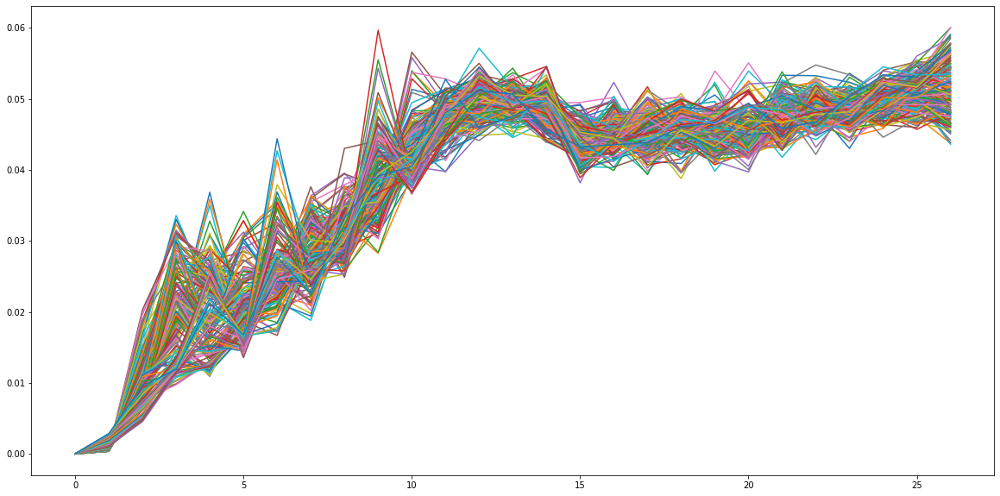

In [123]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)

plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

## FFT + 3 head Attention(Time,FFT,STFT)

In [128]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

#Time Head
timeDist = TimeDistributed(Flatten())(inputs)
units = timeDist.shape[2]
# compute importance for each stepattended_LSTM_out
attention = Dense(units, activation='tanh')(timeDist) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
#attention = Dense(1, activation='tanh')(timeDist2)
print('attention.shape: ', attention.shape)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention1_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
sent_representation = Multiply()([timeDist, attention])
#For each timestep update a single weight on Dense layer
attended_out = Lambda(lambda x : K.sum(x, axis=1))(sent_representation) ## this line

#Frequency Head Magnitude
timeDist3 = TimeDistributed(Flatten())(inputs)
timeDist3 = Permute([2, 1])(timeDist3) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist3.shape',timeDist3.shape)
fftLayer = Lambda(lambda x : tf.math.abs(tf.signal.rfft(x)))(timeDist3) ## transform to frequency domain with TF
fftLayer  = Permute([2, 1])(fftLayer )#transpose back for the following shape
print('fftLayer.shape',fftLayer.shape)  
#(None,num_of_frequencies,num_of_features)
#compress frequency domain data from 10000 to downsized dimension for attention
#Time distributed is now frequency distributed
timeDist4 = fftLayer
units = timeDist4.shape[2]

# compute importance for each frequency
attention2 = Dense(units, activation='tanh')(timeDist4) ## weight matrix W (= units x units)
attention2 = Dense(1, activation='linear')(attention2)     ## weight matrix v (= units x 1)
#attention2 = Dense(1, activation='tanh')(timeDist4)
attention2 = Flatten()(attention2)
attention2 = Activation('softmax',name='attention2_weights')(attention2)
attention2 = RepeatVector(units)(attention2)
attention2 = Permute([2, 1])(attention2)
sent_representation2 = Multiply()([timeDist4, attention2])
attended_out2 = Lambda(lambda x : K.sum(x, axis=1))(sent_representation2) ## this line

#Frequency Head STFT
timeDist5 = TimeDistributed(Flatten())(inputs)
timeDist5 = Permute([2, 1])(timeDist5) #transpose for FFT. FFT library treats the last dimension as time
print('timeDist5.shape',timeDist5.shape)
window_length = 26
fftLayer2 = Lambda(lambda x : tf.math.abs(
    tf.signal.stft(
        x, window_length, 1, fft_length=None,
        window_fn=tf.signal.hann_window, pad_end=False, name=None
)))(timeDist5) ## transform to frequency domain with TF(timeDist5) ## transform to frequency domain with TF
fftLayer2 = tf.reshape(fftLayer2, [-1, fftLayer2.shape[1] , fftLayer2.shape[2] * fftLayer2.shape[3]])
fftLayer2  = Permute([2, 1])(fftLayer2)#transpose back for the following shape
print('fftLayer2.shape',fftLayer2.shape)  
timeDist6 = fftLayer2
units = timeDist6.shape[2]

# compute importance for each frequency
attention3 = Dense(units, activation='tanh')(timeDist6) ## weight matrix W (= units x units)
attention3 = Dense(1, activation='linear')(attention3)     ## weight matrix v (= units x 1)
#attention3 = Dense(1, activation='tanh')(timeDist6)
attention3 = Flatten()(attention3)
attention3 = Activation('softmax',name='attention3_weights')(attention3)
attention3 = RepeatVector(units)(attention3)
attention3 = Permute([2, 1])(attention3)
sent_representation3 = Multiply()([timeDist6, attention3])
attended_out3 = Lambda(lambda x : K.sum(x, axis=1))(sent_representation3) ## this line
#For each timestep update a single weight on Dense layer


merge = concatenate([attended_out, attended_out2, attended_out3], axis=1)
D_temp = Dense(units*2, activation='relu')(merge) # hidden layer

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(D_temp))
outputs = Dense2

model = Model(inputs, outputs, name="Attention_Time_FFT_STFT")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)

attention.shape:  (None, 52, 1)
timeDist3.shape (None, 625, 52)
fftLayer.shape (None, 27, 625)
timeDist5.shape (None, 625, 52)
fftLayer2.shape (None, 459, 625)
Model: "Attention_Time_FFT_STFT"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_43 (InputLayer)           [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_94 (TimeDistri (None, 52, 625)      0           input_43[0][0]                   
__________________________________________________________________________________________________
time_distributed_93 (TimeDistri (None, 52, 625)      0           input_43[0][0]                   
__________________________________________________________________________________________________
permute_84 (Per

# TimeDistributed Attention on Pixels

In [153]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

timeDist = TimeDistributed(Flatten())(inputs)
timeDist = Permute([2,1])(timeDist) #3D transpose between pixel and time dimension
units = timeDist.shape[2]
# compute importance for each step
#q^TxWxk_i, W is a projection of dimensions if key is different dimension from the query k_i.
attention = Dense(units*100, activation='tanh',name="W")(timeDist) ## weight matrix W (= units_key x units_project)
attention = Dense(1, activation='linear',name ="Query")(attention) ## weight matrix v (= units x 1)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
attention = Multiply()([timeDist, attention])
sent_representation = Permute([2, 1])(attention) #transpose back to time being shape[1]
attended_out = Lambda(lambda x : K.sum(x, axis=1))(attended_out)## this line



D_temp = Dense(units*2, activation='relu')(sent_representation) # hidden layer

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(D_temp)
outputs = Dense2


model = Model(inputs, outputs, name="TimeDistributed_attention")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


Model: "TimeDistributed_attention"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_56 (InputLayer)           [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_109 (TimeDistr (None, 52, 625)      0           input_56[0][0]                   
__________________________________________________________________________________________________
permute_124 (Permute)           (None, 625, 52)      0           time_distributed_109[0][0]       
__________________________________________________________________________________________________
W (Dense)                       (None, 625, 5200)    275600      permute_124[0][0]                
__________________________________________________________________________

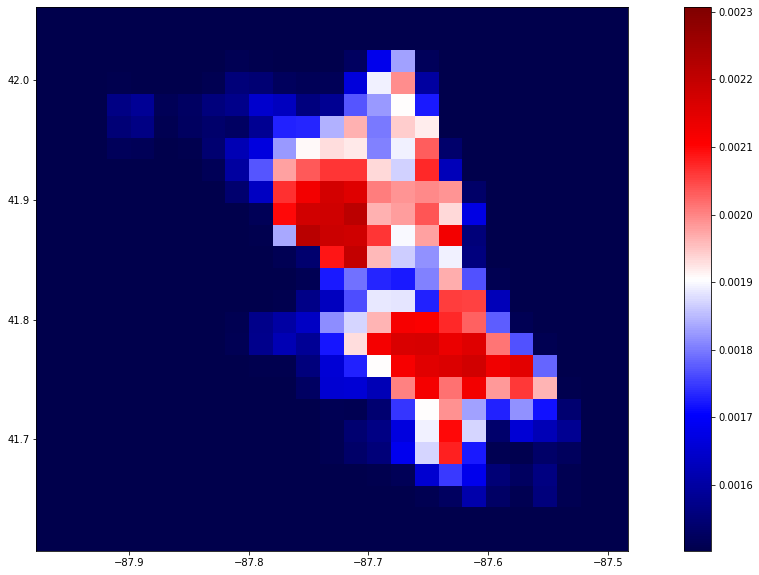

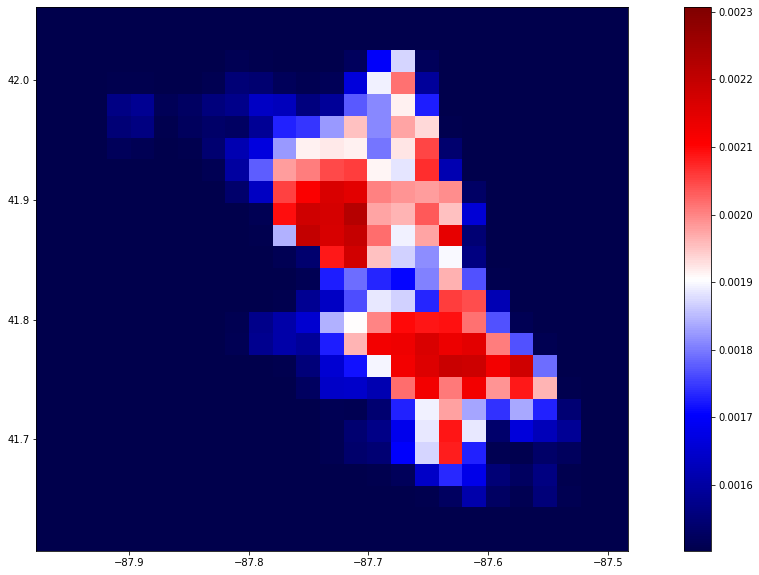

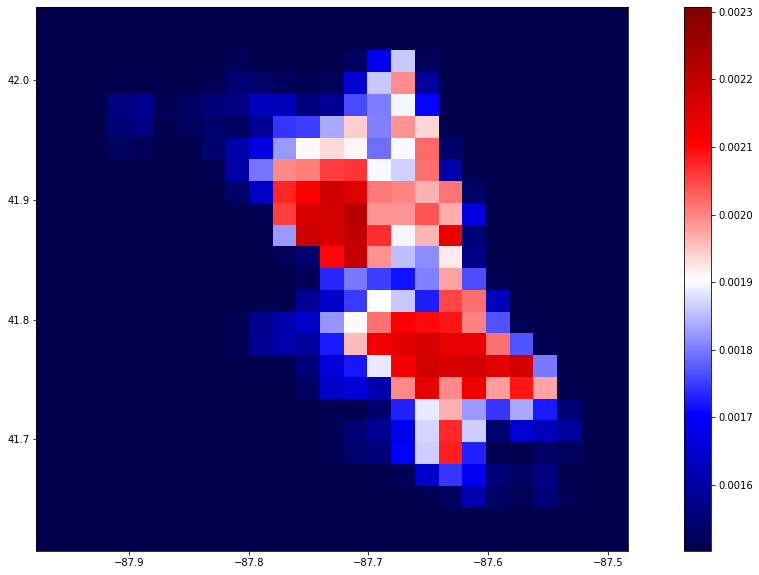

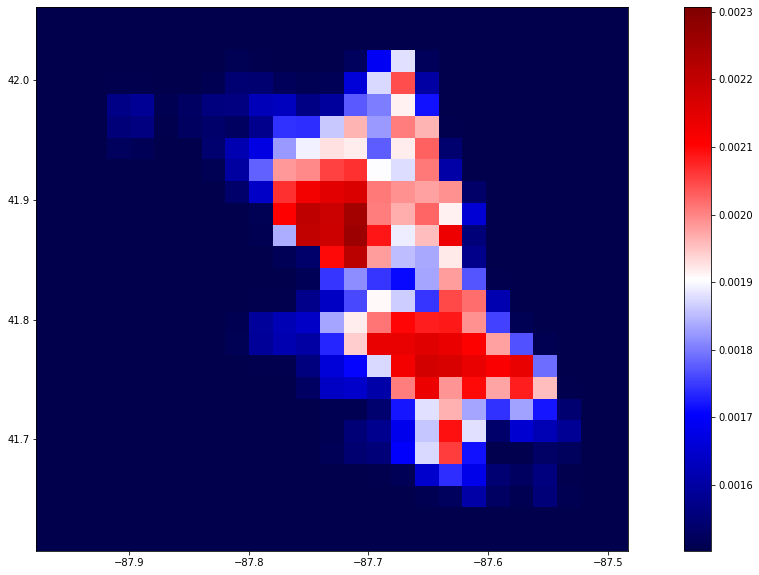

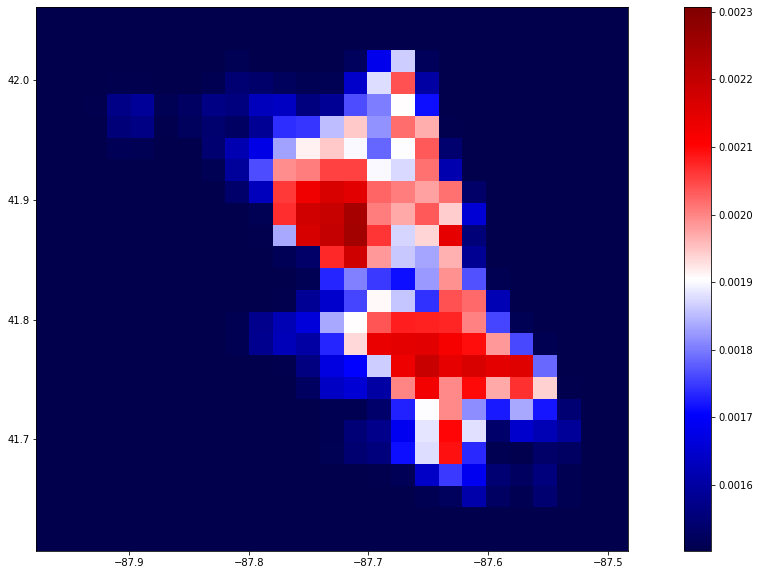

...

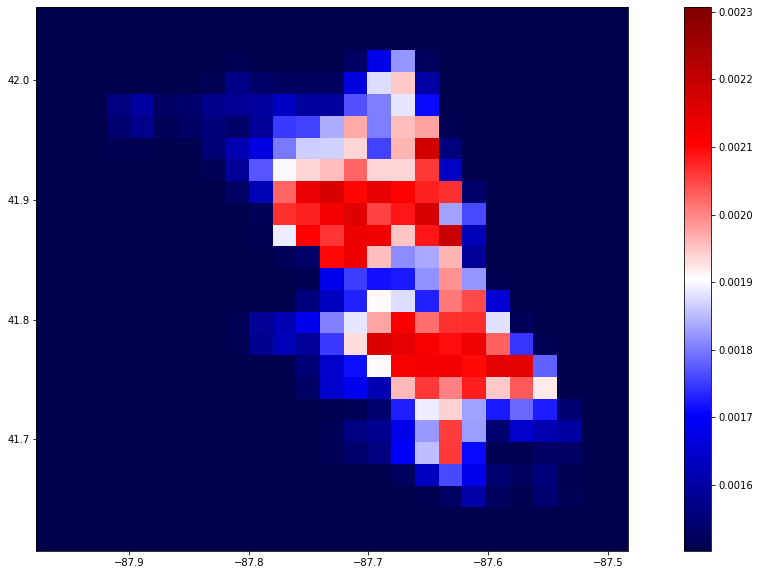

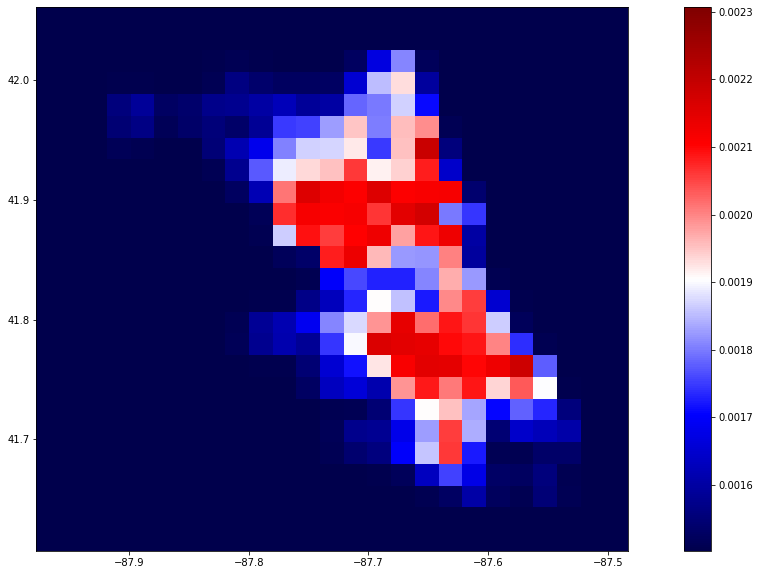

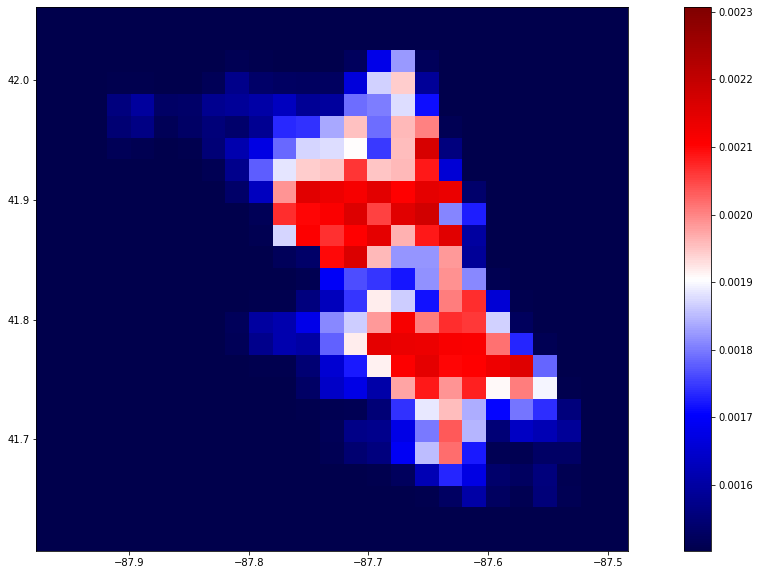

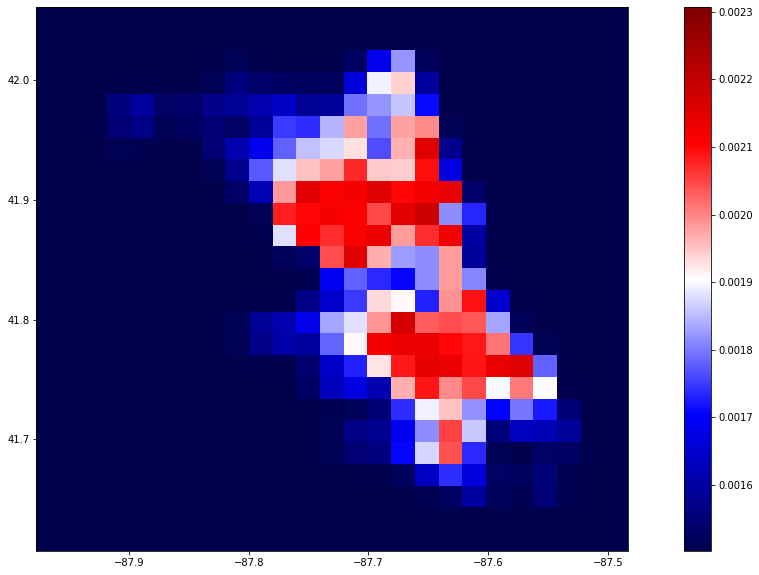

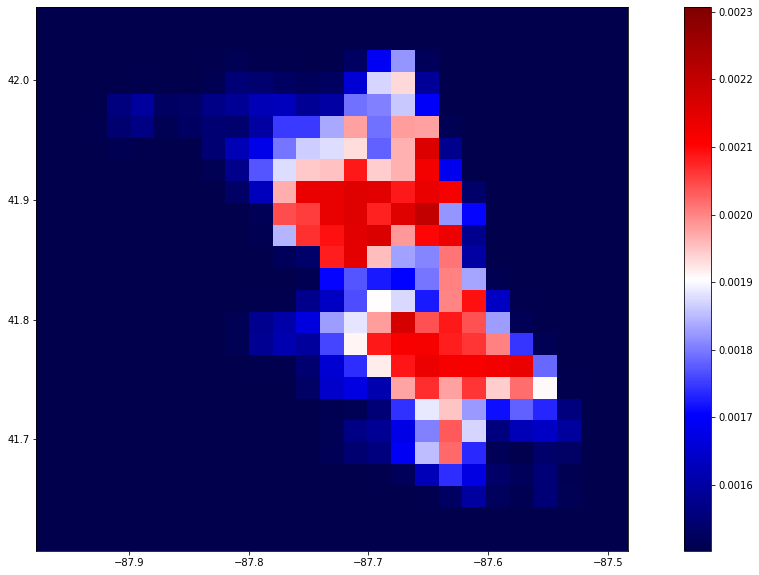

In [118]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)

vmax,vmin = np.max(intermediate_layer_model.predict(X_valid)),np.min(intermediate_layer_model.predict(X_valid))

x = [-87.9361,-87.5245]
y = [41.6447,42.023]
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY

for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    #print(intermediate_output.shape)
    attImage = intermediate_output[0,:].reshape(25,25)
    #print(attImage.shape)
    plt.figure(figsize=(20,10))
    plt.imshow( X=np.rot90(attImage),vmin=vmin, vmax=vmax,cmap=plt.cm.seismic, extent=[xmin, xmax, ymin, ymax])
    plt.colorbar()
    plt.show()

## TimeDistributed attention + attention on time

In [140]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

timeDist = TimeDistributed(Flatten())(inputs)
timeDist = Permute([2,1])(timeDist) #3D transpose between pixel and time dimension
units = timeDist.shape[2]
# compute importance for each step
#q^TxWxk_i, W is a projection of dimensions if key is different dimension from the query k_i.
attention1 = Dense(units*100, activation='tanh')(timeDist) ## weight matrix W (= units_key x units_project)
attention1 = Dense(1, activation='linear')(attention1)     ## weight matrix v (= units x 1)
attention1 = Flatten()(attention1)
attention1 = Activation('softmax',name='attention1_weights')(attention1)
attention1 = RepeatVector(units)(attention1)
attention1 = Permute([2, 1])(attention1)
attention1 = Multiply()([timeDist, attention1])
sent_representation = Permute([2, 1])(attention1) #transpose back to time being shape[1]
timeDist2 = sent_representation
print(timeDist2.shape)

units = timeDist2.shape[2]
# compute importance for each step
attention2 = Dense(units, activation='tanh')(timeDist2) ## weight matrix W (= units x units) dimension reduction with W
attention2 = Dense(1, activation='linear')(attention2)     ## weight matrix v (= units x 1)
attention2 = Flatten()(attention2)
attention2 = Activation('softmax',name='attention2_weights')(attention2)
attention2 = RepeatVector(units)(attention2)
attention2 = Permute([2, 1])(attention2)
sent_representation2 = Multiply()([timeDist2, attention2])
attended_out2 = Lambda(lambda x : K.sum(x, axis=1))(sent_representation2) ## this line
D_temp2 = Dense(units*2, activation='relu')(attended_out2) # hidden layer

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(D_temp2))
outputs = Dense2

model = Model(inputs, outputs, name="TimeDistributed_attention1_plus_attention2_on_time")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


(None, 52, 625)
Model: "TimeDistributed_attention1_plus_attention2_on_time"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_50 (InputLayer)           [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_101 (TimeDistr (None, 52, 625)      0           input_50[0][0]                   
__________________________________________________________________________________________________
permute_105 (Permute)           (None, 625, 52)      0           time_distributed_101[0][0]       
__________________________________________________________________________________________________
dense_215 (Dense)               (None, 625, 5200)    275600      permute_105[0][0]                
_________________________________

In [58]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention1_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)

#### We peak at trained attention1 on the image layer

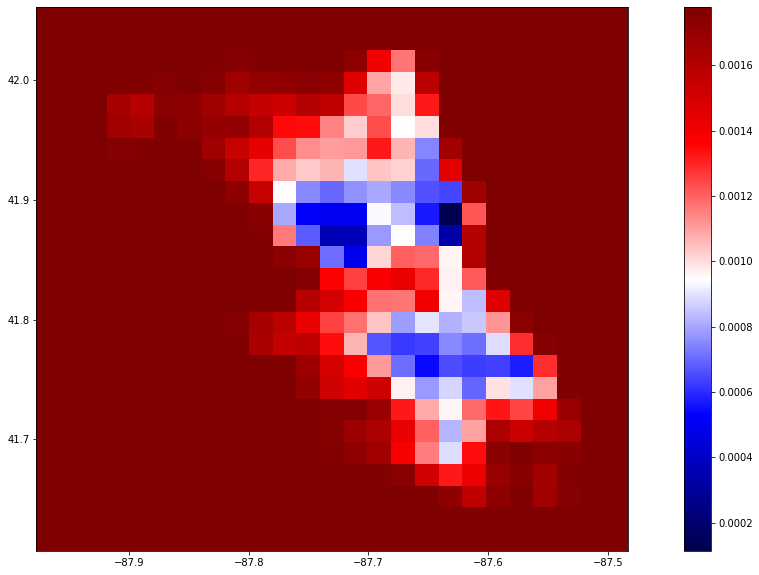

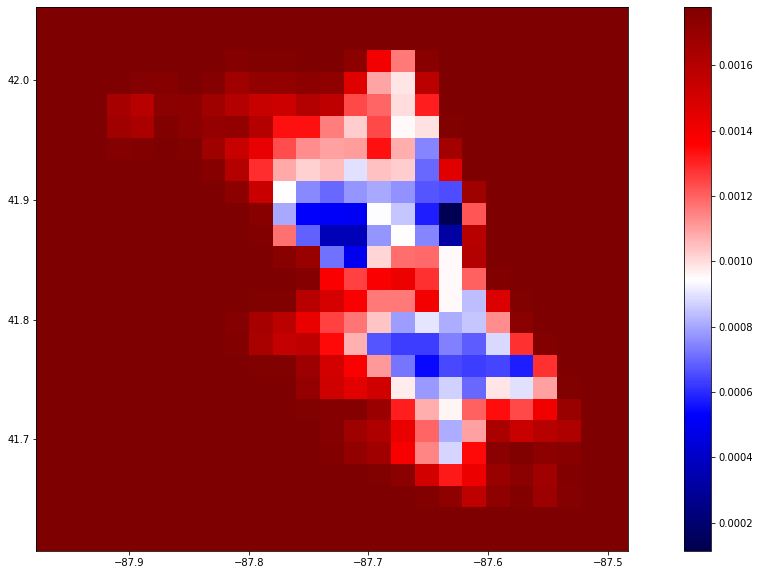

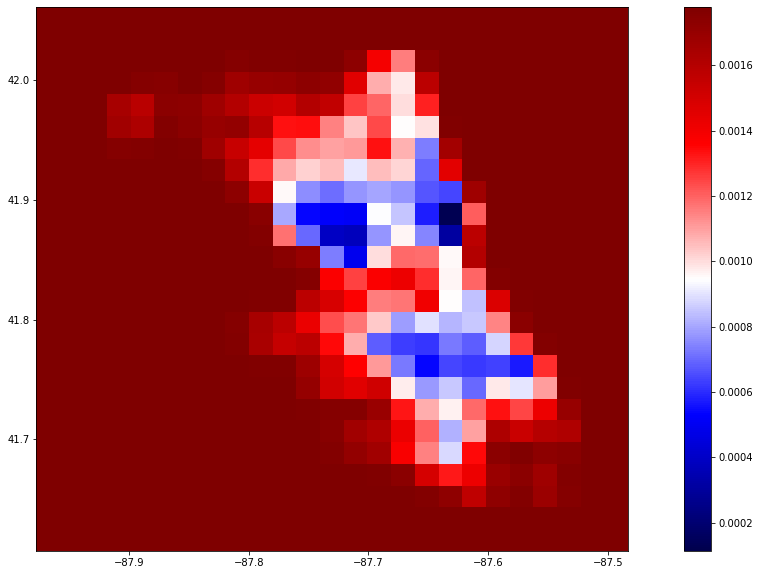

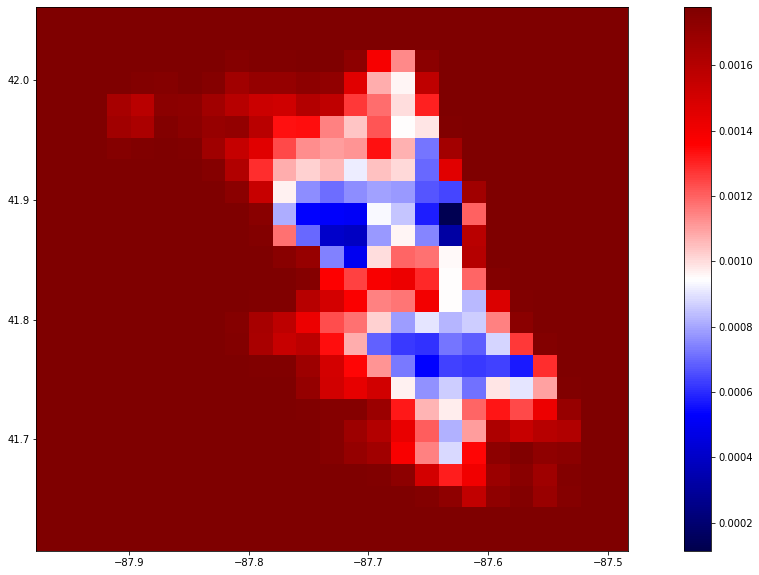

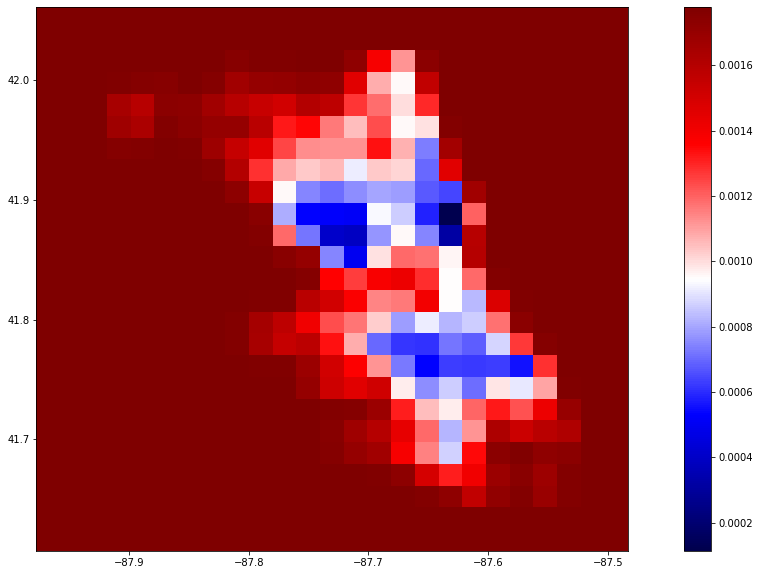

...

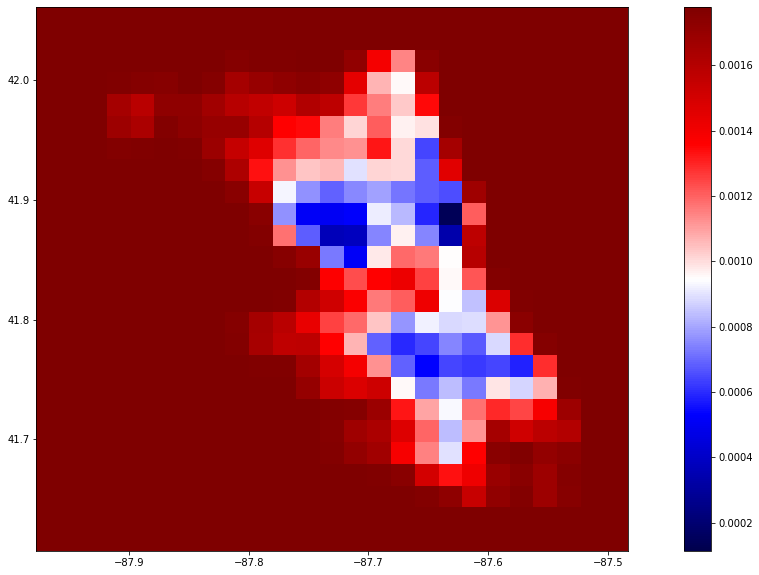

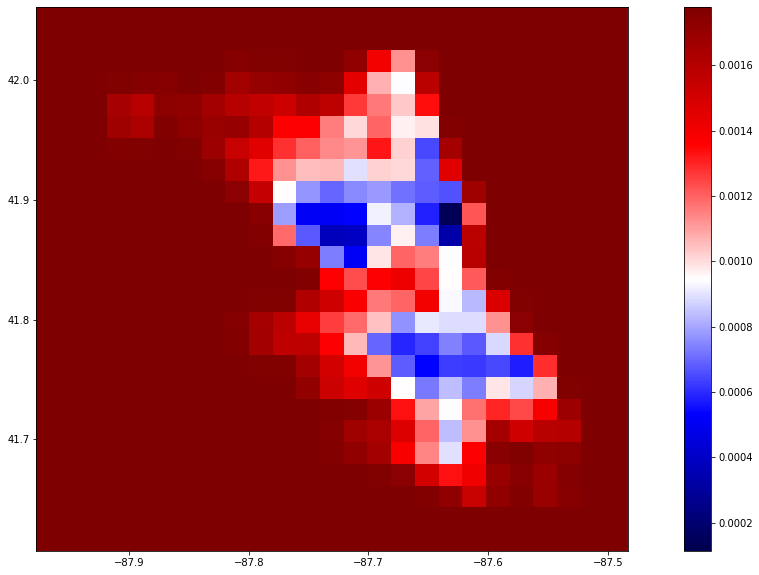

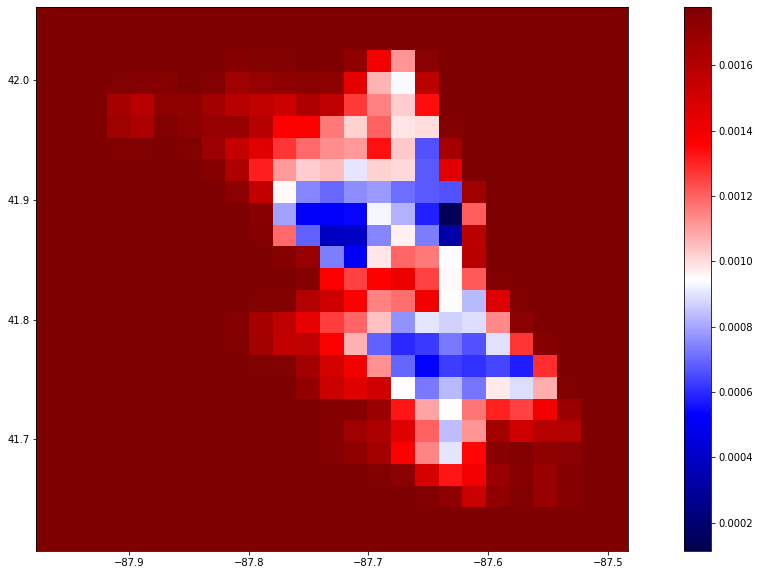

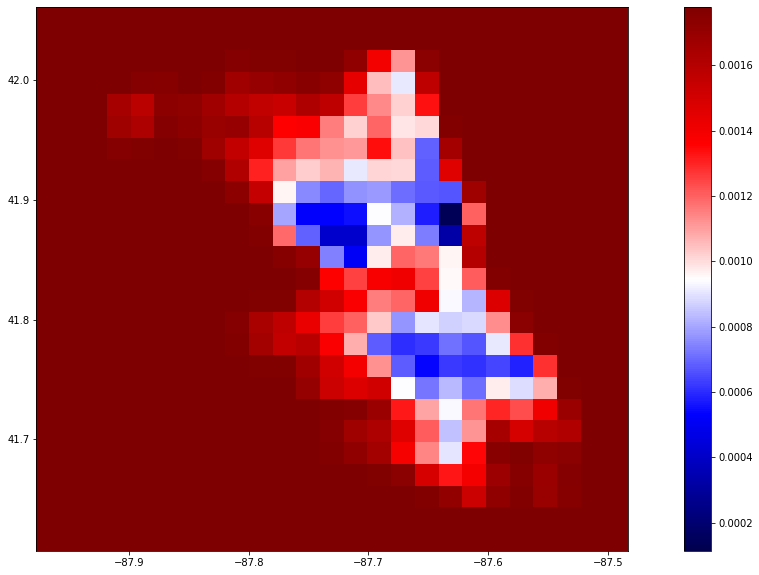

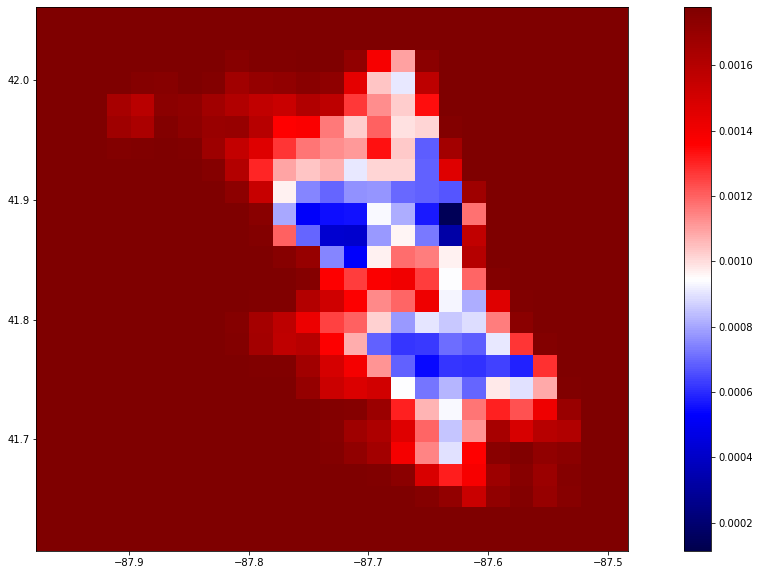

In [59]:
vmax,vmin = np.max(intermediate_layer_model.predict(X_valid)),np.min(intermediate_layer_model.predict(X_valid))

x = [-87.9361,-87.5245]
y = [41.6447,42.023]
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY

for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    #print(intermediate_output.shape)
    attImage = intermediate_output[0,:].reshape(25,25)
    #print(attImage.shape)
    plt.figure(figsize=(20,10))
    plt.imshow( X=np.rot90(attImage),vmin=vmin, vmax=vmax,cmap=plt.cm.seismic, extent=[xmin, xmax, ymin, ymax])
    plt.colorbar()
    plt.show()

In [60]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention2_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)

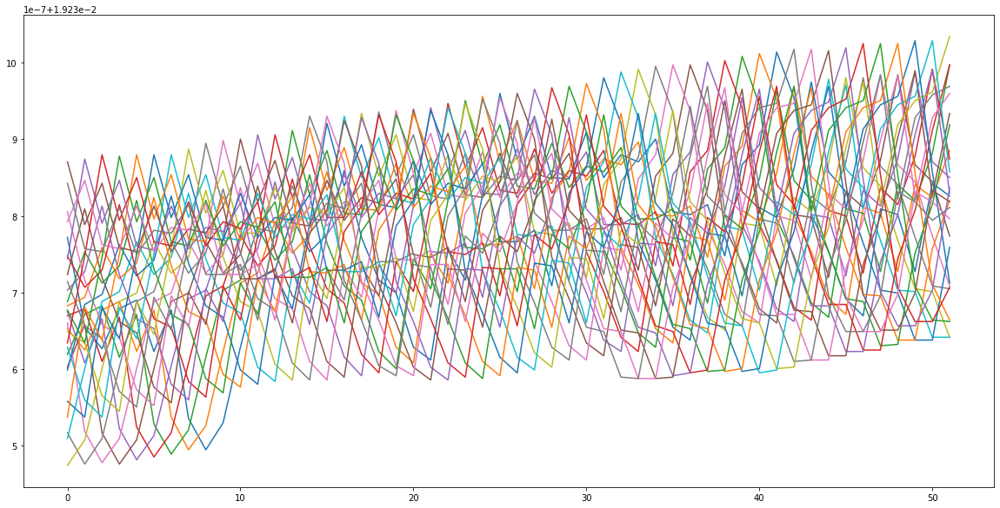

In [61]:
plt.figure(figsize=(20,10))
for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

## 2 Headed: Attention Pixel + Attention Timestep 

In [143]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

timeDist = TimeDistributed(Flatten())(inputs)
timeDist = Permute([2,1])(timeDist) #3D transpose between pixel and time dimension
units = timeDist.shape[2]
# compute importance for each step
#q^TxWxk_i, W is a projection of dimensions if key is different dimension from the query k_i.
attention1 = Dense(units, activation='tanh',name="W")(timeDist) ## weight matrix W (= units_key x units_project)
attention1 = Dense(1, activation='linear',name ="Query")(attention1) ## weight matrix v (= units x 1)
attention1 = Flatten()(attention1)
attention1 = Activation('softmax',name='attention1_weights')(attention1)
attention1 = RepeatVector(units)(attention1)
attention1 = Permute([2, 1])(attention1)
attention1 = Multiply()([timeDist, attention1])
attention1 = Permute([2, 1])(attention1) #transpose back to time being shape[1]
attention1 = Lambda(lambda x : K.sum(x, axis=1))(attention1) ## this line

timeDist2 = TimeDistributed(Flatten())(inputs)
units = timeDist2.shape[2]
# compute importance for each step
attention2 = Dense(units, activation='tanh')(timeDist2) ## weight matrix W (= units x units/10) dimension reduction with W
attention2 = Dense(1, activation='linear')(attention2)     ## weight matrix v (= units x 1)
attention2 = Flatten()(attention2)
attention2 = Activation('softmax',name='attention2_weights')(attention2)
attention2 = RepeatVector(units)(attention2)
attention2 = Permute([2, 1])(attention2)
attention2 = Multiply()([timeDist2, attention2])
attention2 = Lambda(lambda x : K.sum(x, axis=1))(attention2) ## this line


merge = Concatenate()([attention1, attention2])
D_temp = Dense(units*2, activation='relu')(merge) # hidden layer

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(Flatten()(D_temp))
outputs = Dense2


model = Model(inputs, outputs, name="2Headed_TimeDistributed_attention1_plus_attention2_on_time")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


Model: "TimeDistributed_attention1_plus_attention2_on_time"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_52 (InputLayer)           [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_104 (TimeDistr (None, 52, 625)      0           input_52[0][0]                   
__________________________________________________________________________________________________
permute_113 (Permute)           (None, 625, 52)      0           time_distributed_104[0][0]       
__________________________________________________________________________________________________
W (Dense)                       (None, 625, 52)      2756        permute_113[0][0]                
_________________________________________________

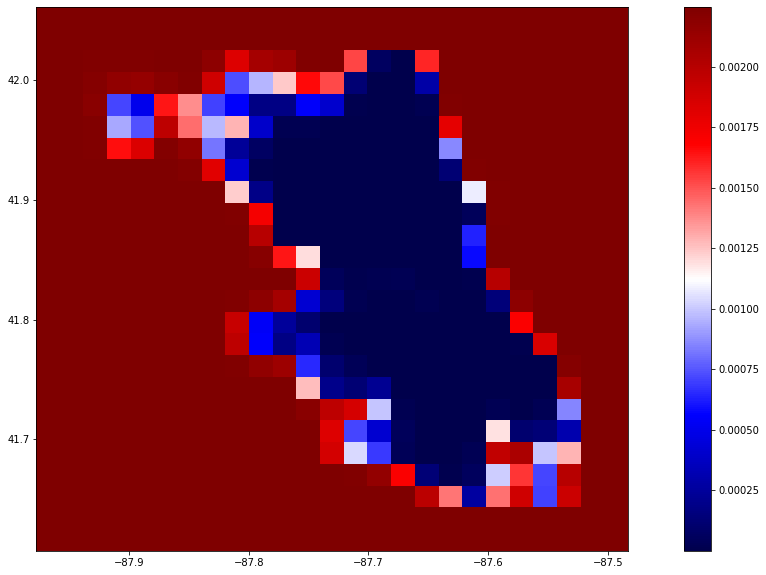

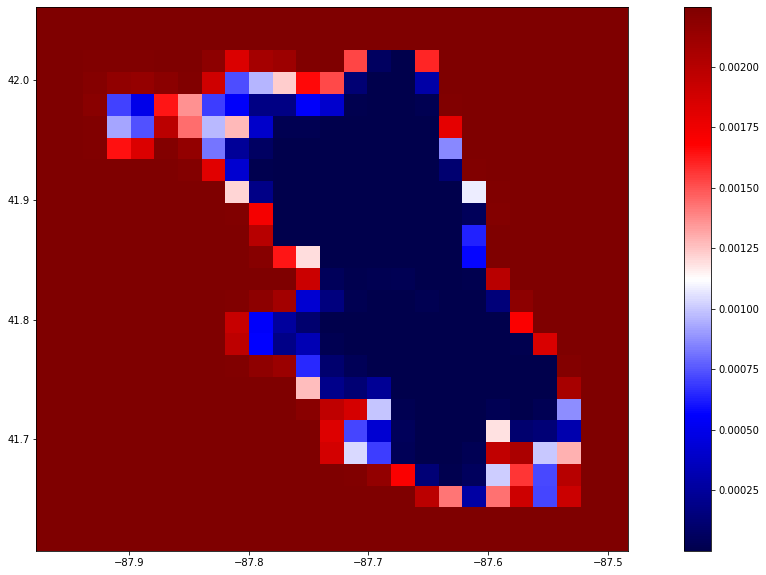

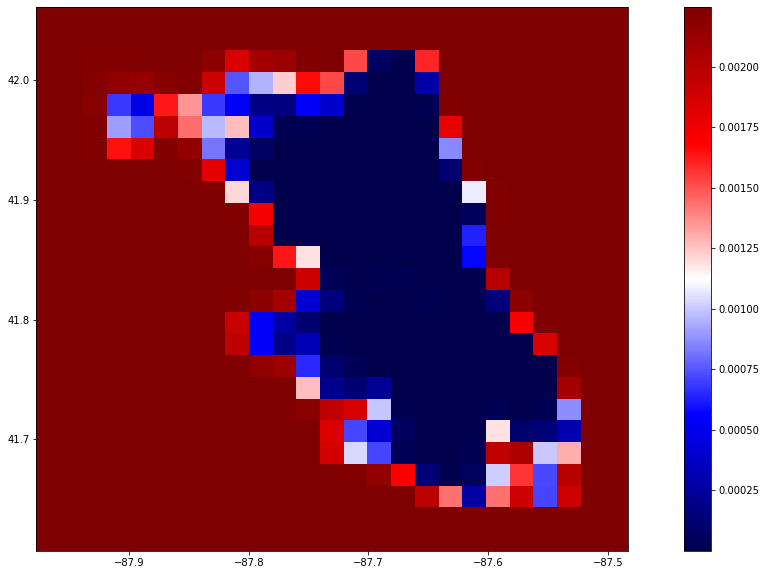

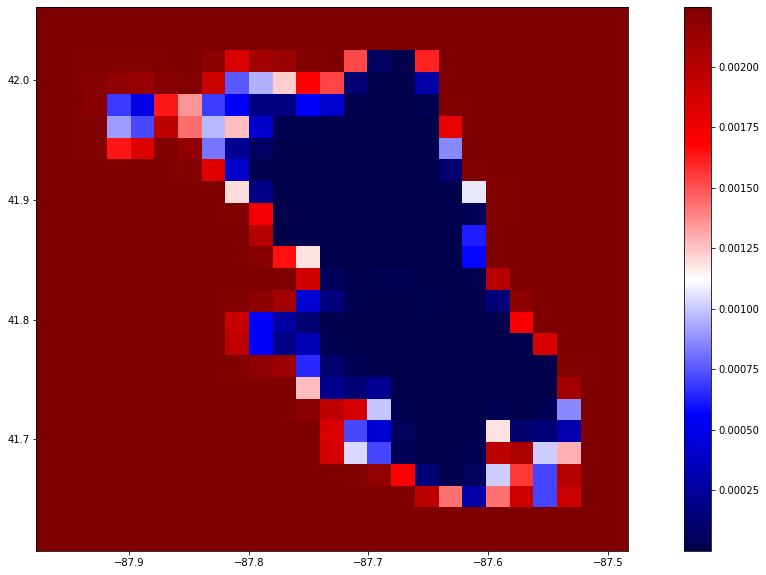

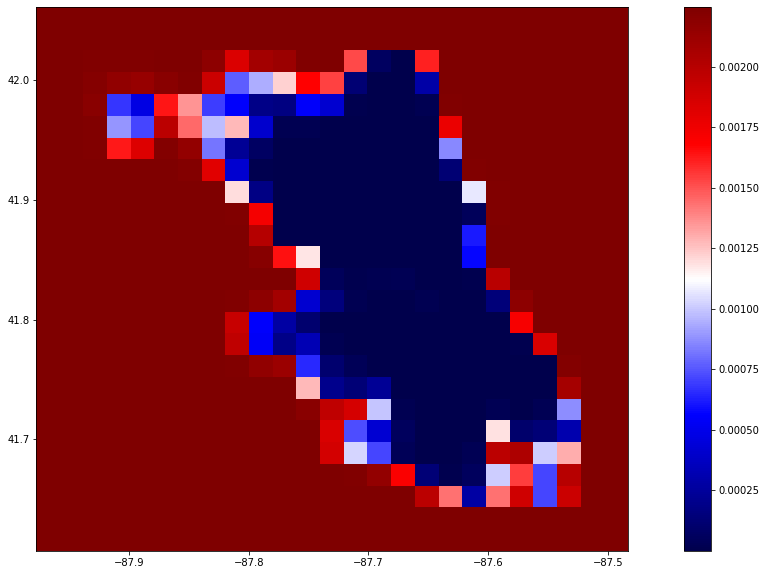

...

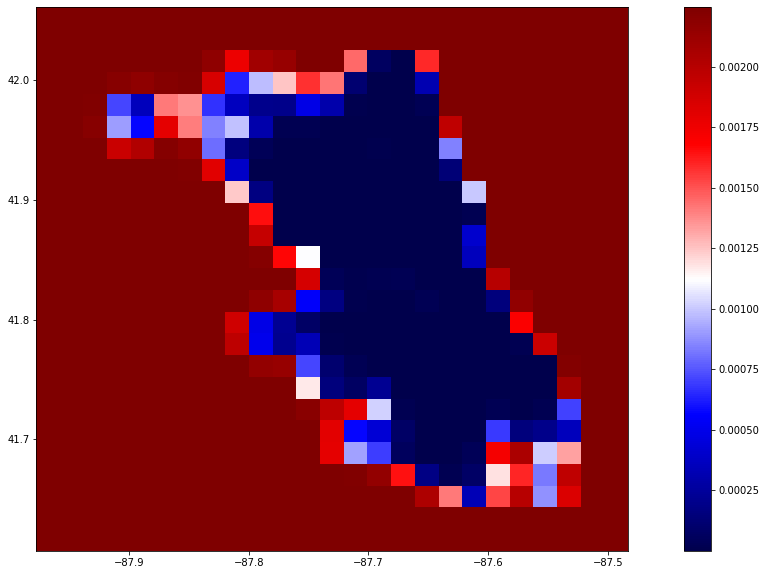

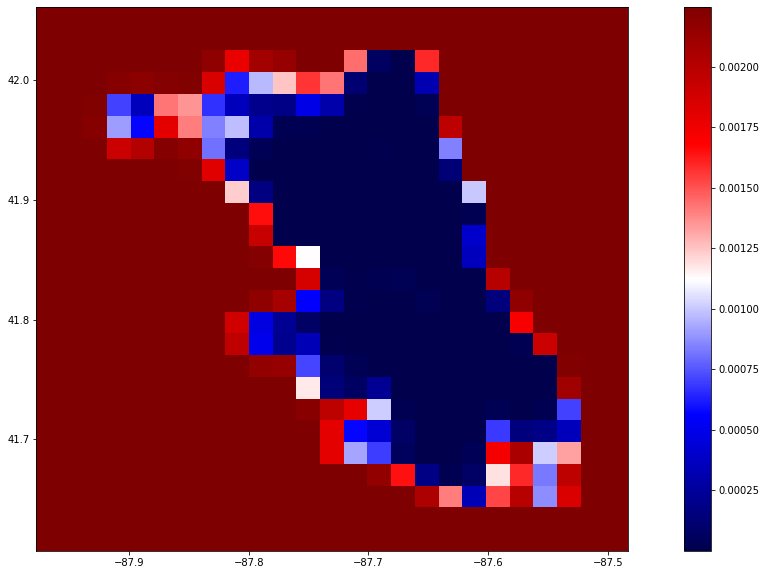

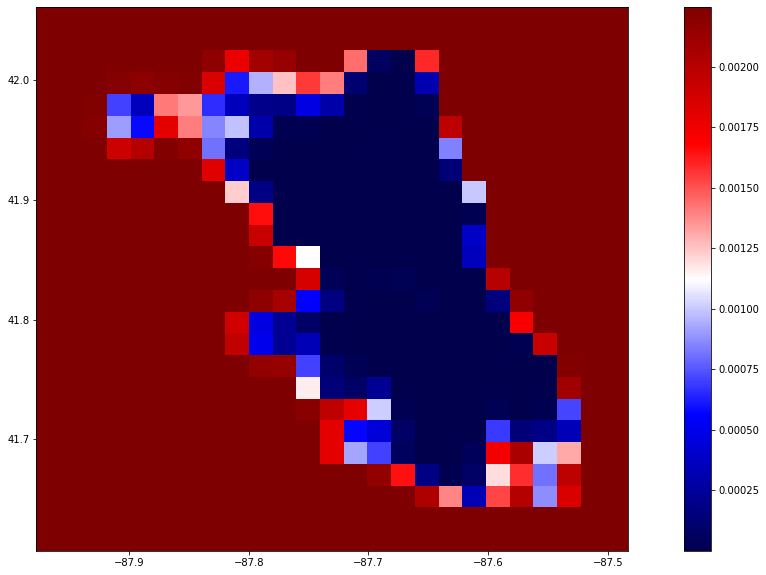

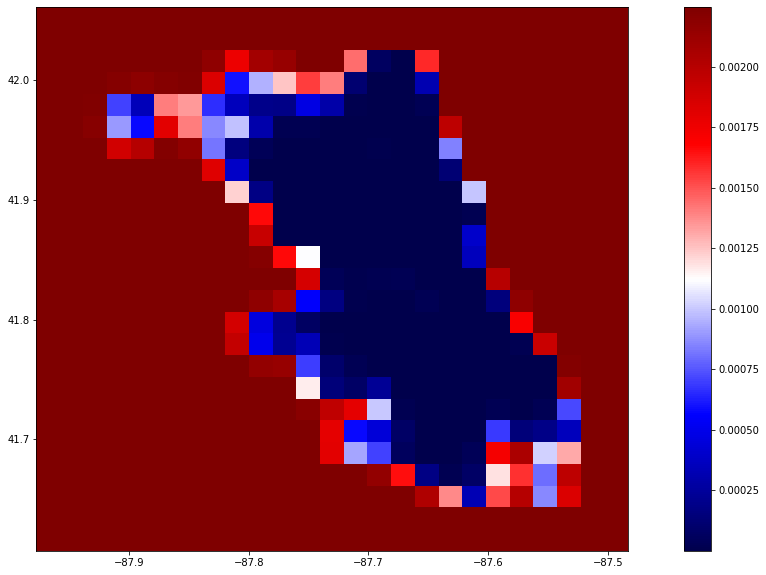

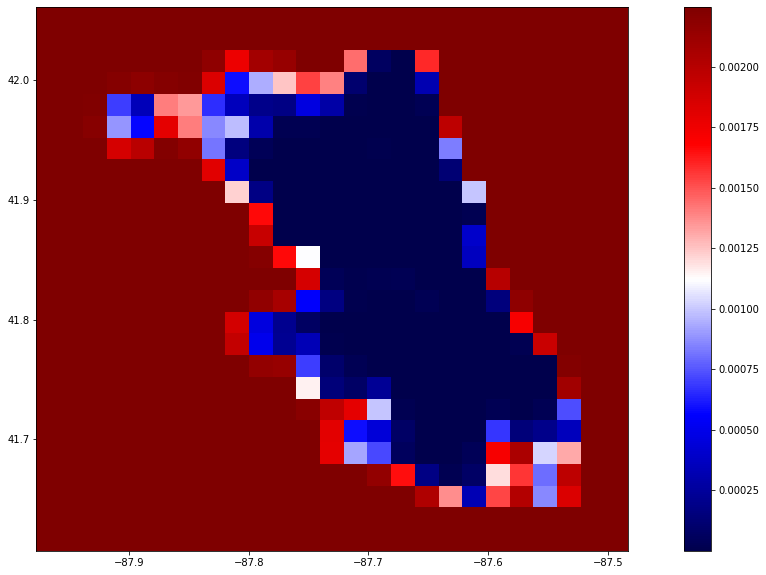

In [146]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention1_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)

vmax,vmin = np.max(intermediate_layer_model.predict(X_valid)),np.min(intermediate_layer_model.predict(X_valid))

x = [-87.9361,-87.5245]
y = [41.6447,42.023]
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY

for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    #print(intermediate_output.shape)
    attImage = intermediate_output[0,:].reshape(25,25)
    #print(attImage.shape)
    plt.figure(figsize=(20,10))
    plt.imshow( X=np.rot90(attImage),vmin=vmin, vmax=vmax,cmap=plt.cm.seismic, extent=[xmin, xmax, ymin, ymax])
    plt.colorbar()
    plt.show()

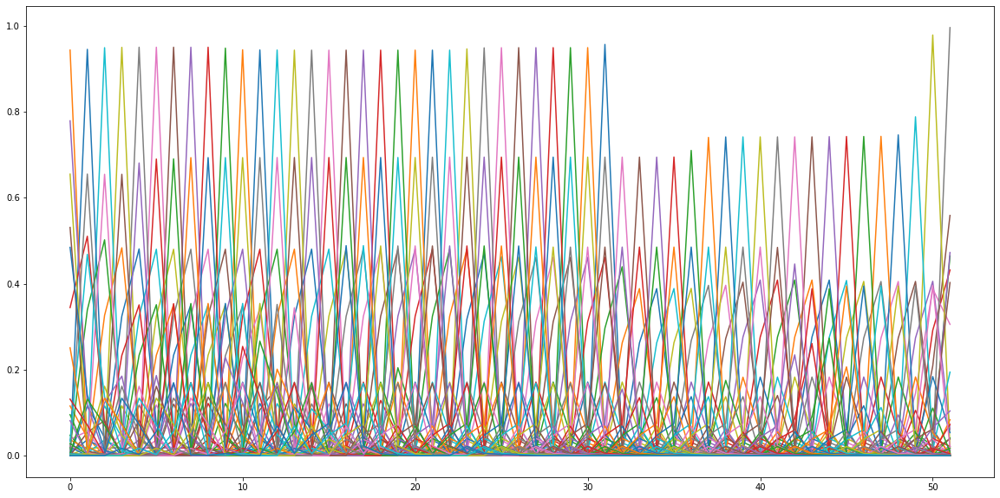

In [145]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention2_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
plt.figure(figsize=(20,10))

for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

## TimeDistributed Attention + LSTM

In [167]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

timeDist = TimeDistributed(Flatten())(inputs)
timeDist = Permute([2,1])(timeDist) #3D transpose between pixel and time dimension
units = timeDist.shape[2]
# compute importance for each step
#q^TxWxk_i, W is a projection of dimensions if key is different dimension from the query k_i.
attention = Dense(units*100, activation='tanh',name="W")(timeDist) ## weight matrix W (= units_key x units_project)
attention = Dense(1, activation='linear',name ="Query")(attention) ## weight matrix v (= units x 1)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)
attention = Multiply()([timeDist, attention])
sent_representation = Permute([2, 1])(attention) #transpose back to time being shape[1]
attended_out = TimeDistributed(Dense(1000))(sent_representation)
#attended_out = Lambda(lambda x : K.sum(x, axis=1))(sent_representation)## this line

LSTM_units = 1000
LSTM_layer1 = LSTM(LSTM_units, return_sequences=False)(attended_out)

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(LSTM_layer1)
outputs = Dense2

model = Model(inputs, outputs, name="TimeDistributed_attention_plus_LSTM")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)

Model: "TimeDistributed_attention_plus_LSTM"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_67 (InputLayer)           [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_120 (TimeDistr (None, 52, 625)      0           input_67[0][0]                   
__________________________________________________________________________________________________
permute_157 (Permute)           (None, 625, 52)      0           time_distributed_120[0][0]       
__________________________________________________________________________________________________
W (Dense)                       (None, 625, 5200)    275600      permute_157[0][0]                
________________________________________________________________

## ---------------------> Run fit on any of the previous model here <--------------------------

In [170]:
EPOCHS = 5

earlystop_callback = tf.keras.callbacks.EarlyStopping(monitor="val_loss",
    min_delta=0,
    patience=EPOCHS*5,
    verbose=1,
    mode="auto",
    baseline=None,
    restore_best_weights=True,)

logdir = os.path.join("./logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_cbk = tf.keras.callbacks.TensorBoard(log_dir=logdir)

modelfilename = checkpoint_filepath + '_'+\
                    datetime.datetime.now().strftime("%Y%m%d-%H%M%S")\
                    + "_model.hdf5"

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    modelfilename,
    save_weights_only=False,
    monitor='val_loss',#'val_accuracy',
    mode='min',
    verbose=1,
    period = 1,
    save_best_only=True)


model.summary()

model_history = model.fit(X_train,Y_train, 
                             validation_data=(X_valid, Y_valid),
                             epochs=500, 
                             batch_size=21, 
                             callbacks=[tensorboard_cbk,
                             #hp.KerasCallback(logdir, hparams),
                             earlystop_callback,
                             model_checkpoint_callback
                                       ])

valid_loss, valid_acc = model.evaluate(X_valid, Y_valid, verbose=2) # 5/2020 nt: use validation set
print ("valid_accuracy_MAE=%s, valid_loss=%s" % (valid_acc, valid_loss))

Model: "Flattened_LTSM"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_68 (InputLayer)        [(None, 52, 25, 25, 1)]   0         
_________________________________________________________________
time_distributed_122 (TimeDi (None, 52, 625)           0         
_________________________________________________________________
lstm_26 (LSTM)               (None, 52, 1000)          6504000   
_________________________________________________________________
lstm_27 (LSTM)               (None, 52, 1000)          8004000   
_________________________________________________________________
lstm_28 (LSTM)               (None, 1000)              8004000   
_________________________________________________________________
dense_249 (Dense)            (None, 625)               625625    
Total params: 23,137,625
Trainable params: 23,137,625
Non-trainable params: 0
________________________________________

567/576 [============================>.] - ETA: 0s - loss: 0.0043 - mae: 0.0043
Epoch 00018: val_loss improved from 0.00648 to 0.00639, saving model to /home/zhimin90/DePaul/CSC695/Github/CSC695-Masters-Research-on-Neural-Network-Time-Series-Attention-Models/Asset/checkpoints/_20200718-151918_model.hdf5
576/576 [==============================] - 4s 6ms/sample - loss: 0.0043 - mae: 0.0043 - val_loss: 0.0064 - val_mae: 0.0064
Epoch 19/500
567/576 [============================>.] - ETA: 0s - loss: 0.0041 - mae: 0.0041
Epoch 00019: val_loss did not improve from 0.00639
576/576 [==============================] - 3s 6ms/sample - loss: 0.0041 - mae: 0.0041 - val_loss: 0.0064 - val_mae: 0.0064
Epoch 20/500
567/576 [============================>.] - ETA: 0s - loss: 0.0042 - mae: 0.0042
Epoch 00020: val_loss did not improve from 0.00639
576/576 [==============================] - 3s 6ms/sample - loss: 0.0042 - mae: 0.0042 - val_loss: 0.0064 - val_mae: 0.0064
Epoch 21/500
567/576 [================

567/576 [============================>.] - ETA: 0s - loss: 0.0035 - mae: 0.0035
Epoch 00044: val_loss did not improve from 0.00569
576/576 [==============================] - 3s 5ms/sample - loss: 0.0035 - mae: 0.0035 - val_loss: 0.0058 - val_mae: 0.0058
Epoch 45/500
567/576 [============================>.] - ETA: 0s - loss: 0.0034 - mae: 0.0034
Epoch 00045: val_loss did not improve from 0.00569
576/576 [==============================] - 3s 5ms/sample - loss: 0.0034 - mae: 0.0034 - val_loss: 0.0058 - val_mae: 0.0058
Epoch 46/500
567/576 [============================>.] - ETA: 0s - loss: 0.0035 - mae: 0.0035
Epoch 00046: val_loss improved from 0.00569 to 0.00569, saving model to /home/zhimin90/DePaul/CSC695/Github/CSC695-Masters-Research-on-Neural-Network-Time-Series-Attention-Models/Asset/checkpoints/_20200718-151918_model.hdf5
576/576 [==============================] - 3s 6ms/sample - loss: 0.0035 - mae: 0.0035 - val_loss: 0.0057 - val_mae: 0.0057
Epoch 47/500
567/576 [================

567/576 [============================>.] - ETA: 0s - loss: 0.0031 - mae: 0.0031
Epoch 00072: val_loss did not improve from 0.00552
576/576 [==============================] - 3s 6ms/sample - loss: 0.0031 - mae: 0.0031 - val_loss: 0.0057 - val_mae: 0.0057
Epoch 73/500
567/576 [============================>.] - ETA: 0s - loss: 0.0031 - mae: 0.0031
Epoch 00073: val_loss improved from 0.00552 to 0.00549, saving model to /home/zhimin90/DePaul/CSC695/Github/CSC695-Masters-Research-on-Neural-Network-Time-Series-Attention-Models/Asset/checkpoints/_20200718-151918_model.hdf5
576/576 [==============================] - 3s 6ms/sample - loss: 0.0031 - mae: 0.0031 - val_loss: 0.0055 - val_mae: 0.0055
Epoch 74/500
567/576 [============================>.] - ETA: 0s - loss: 0.0031 - mae: 0.0031
Epoch 00074: val_loss did not improve from 0.00549
576/576 [==============================] - 3s 6ms/sample - loss: 0.0031 - mae: 0.0031 - val_loss: 0.0057 - val_mae: 0.0057
Epoch 75/500
567/576 [================

Epoch 101/500
567/576 [============================>.] - ETA: 0s - loss: 0.0028 - mae: 0.0028
Epoch 00101: val_loss improved from 0.00547 to 0.00546, saving model to /home/zhimin90/DePaul/CSC695/Github/CSC695-Masters-Research-on-Neural-Network-Time-Series-Attention-Models/Asset/checkpoints/_20200718-151918_model.hdf5
576/576 [==============================] - 4s 6ms/sample - loss: 0.0028 - mae: 0.0028 - val_loss: 0.0055 - val_mae: 0.0055
Epoch 102/500
567/576 [============================>.] - ETA: 0s - loss: 0.0028 - mae: 0.0028
Epoch 00102: val_loss improved from 0.00546 to 0.00544, saving model to /home/zhimin90/DePaul/CSC695/Github/CSC695-Masters-Research-on-Neural-Network-Time-Series-Attention-Models/Asset/checkpoints/_20200718-151918_model.hdf5
576/576 [==============================] - 4s 7ms/sample - loss: 0.0028 - mae: 0.0028 - val_loss: 0.0054 - val_mae: 0.0054
Epoch 103/500
567/576 [============================>.] - ETA: 0s - loss: 0.0028 - mae: 0.0028
Epoch 00103: val_loss 

Epoch 127/500
567/576 [============================>.] - ETA: 0s - loss: 0.0026 - mae: 0.0026
Epoch 00127: val_loss did not improve from 0.00526
576/576 [==============================] - 3s 6ms/sample - loss: 0.0026 - mae: 0.0026 - val_loss: 0.0053 - val_mae: 0.0053
Epoch 128/500
567/576 [============================>.] - ETA: 0s - loss: 0.0026 - mae: 0.0026
Epoch 00128: val_loss did not improve from 0.00526
576/576 [==============================] - 3s 6ms/sample - loss: 0.0026 - mae: 0.0026 - val_loss: 0.0055 - val_mae: 0.0055
Epoch 129/500
567/576 [============================>.] - ETA: 0s - loss: 0.0026 - mae: 0.0026
Epoch 00129: val_loss did not improve from 0.00526
576/576 [==============================] - 4s 6ms/sample - loss: 0.0026 - mae: 0.0026 - val_loss: 0.0055 - val_mae: 0.0055
Epoch 130/500
567/576 [============================>.] - ETA: 0s - loss: 0.0026 - mae: 0.0026
Epoch 00130: val_loss did not improve from 0.00526
576/576 [==============================] - 4s 6ms/s

Epoch 157/500
567/576 [============================>.] - ETA: 0s - loss: 0.0025 - mae: 0.0025
Epoch 00157: val_loss did not improve from 0.00519
576/576 [==============================] - 3s 5ms/sample - loss: 0.0025 - mae: 0.0025 - val_loss: 0.0053 - val_mae: 0.0053
Epoch 158/500
567/576 [============================>.] - ETA: 0s - loss: 0.0024 - mae: 0.0024
Epoch 00158: val_loss did not improve from 0.00519
576/576 [==============================] - 3s 5ms/sample - loss: 0.0024 - mae: 0.0024 - val_loss: 0.0053 - val_mae: 0.0053
Epoch 159/500
567/576 [============================>.] - ETA: 0s - loss: 0.0025 - mae: 0.0025
Epoch 00159: val_loss did not improve from 0.00519
576/576 [==============================] - 3s 4ms/sample - loss: 0.0025 - mae: 0.0025 - val_loss: 0.0053 - val_mae: 0.0053
Epoch 160/500
567/576 [============================>.] - ETA: 0s - loss: 0.0024 - mae: 0.0024
Epoch 00160: val_loss did not improve from 0.00519
576/576 [==============================] - 3s 5ms/s

Epoch 187/500
567/576 [============================>.] - ETA: 0s - loss: 0.0023 - mae: 0.0023
Epoch 00187: val_loss improved from 0.00517 to 0.00514, saving model to /home/zhimin90/DePaul/CSC695/Github/CSC695-Masters-Research-on-Neural-Network-Time-Series-Attention-Models/Asset/checkpoints/_20200718-151918_model.hdf5
576/576 [==============================] - 4s 7ms/sample - loss: 0.0023 - mae: 0.0023 - val_loss: 0.0051 - val_mae: 0.0051
Epoch 188/500
567/576 [============================>.] - ETA: 0s - loss: 0.0023 - mae: 0.0023
Epoch 00188: val_loss did not improve from 0.00514
576/576 [==============================] - 3s 6ms/sample - loss: 0.0023 - mae: 0.0023 - val_loss: 0.0053 - val_mae: 0.0053
Epoch 189/500
567/576 [============================>.] - ETA: 0s - loss: 0.0023 - mae: 0.0023
Epoch 00189: val_loss did not improve from 0.00514
576/576 [==============================] - 3s 6ms/sample - loss: 0.0023 - mae: 0.0023 - val_loss: 0.0052 - val_mae: 0.0052
Epoch 190/500
567/576 

567/576 [============================>.] - ETA: 0s - loss: 0.0022 - mae: 0.0022
Epoch 00216: val_loss did not improve from 0.00504
576/576 [==============================] - 3s 5ms/sample - loss: 0.0022 - mae: 0.0022 - val_loss: 0.0052 - val_mae: 0.0052
Epoch 217/500
567/576 [============================>.] - ETA: 0s - loss: 0.0022 - mae: 0.0022
Epoch 00217: val_loss did not improve from 0.00504
576/576 [==============================] - 3s 6ms/sample - loss: 0.0022 - mae: 0.0022 - val_loss: 0.0052 - val_mae: 0.0052
Epoch 218/500
567/576 [============================>.] - ETA: 0s - loss: 0.0021 - mae: 0.0021
Epoch 00218: val_loss did not improve from 0.00504
576/576 [==============================] - 3s 6ms/sample - loss: 0.0021 - mae: 0.0021 - val_loss: 0.0052 - val_mae: 0.0052
Epoch 219/500
567/576 [============================>.] - ETA: 0s - loss: 0.0021 - mae: 0.0021
Epoch 00219: val_loss did not improve from 0.00504
576/576 [==============================] - 3s 6ms/sample - loss: 

## Validation set result 25x25 pixels

#### Flattened_Fully_Connected: valid_accuracy_MAE=0.0067913793, valid_loss=0.006791379331996304

#### Flattened_LTSM: valid_accuracy_MAE=0.005040973, valid_loss=0.005040973095779175

#### 2DCNN_LTSM: valid_accuracy_MAE=0.0053498237, valid_loss=0.005349824231859121

#### FLATTENED_LTSM_Attention: valid_accuracy_MAE=0.005595601, valid_loss=0.005595600854176345

#### Flattened_Attention_Time: valid_accuracy_MAE=0.0058029336, valid_loss=0.0058029338117708395

#### Attention_FFT: valid_accuracy_MAE=0.0062100464, valid_loss=0.00621004617426798

#### Attention_Time_FFT_STFT: valid_accuracy_MAE=0.0058276486, valid_loss=0.005827648562735132

#### TimeDistributed_attention: valid_accuracy_MAE=0.006259729, valid_loss=0.006259729208044356

#### TimeDistributed_attention1_plus_attention2_on_time: valid_accuracy_MAE=0.006148583, valid_loss=0.006148582597443571

#### 2 headed TimeDistributed_attention1_plus_attention2_on_time: valid_accuracy_MAE=0.0058226553, valid_loss=0.005822655369395985

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
logs_base_dir = "./logs"
os.makedirs(logs_base_dir, exist_ok=True)
%tensorboard --logdir {logs_base_dir}

In [171]:
Predict = model.predict(X_valid)

In [172]:
def reshapePred(Predict, fromLast=1):
    return np.rot90(Predict[-1*fromLast].reshape(int(Predict[-1*fromLast].shape[0]**(1/2)),int(Predict[-1*fromLast].shape[0]**(1/2))))

In [173]:
vmax, vmin = np.max(Predict),np.min(Predict)
vmax, vmin

(1.1602463, -0.002724769)

In [174]:
dvmax, dvmin = np.max(np.abs(Predict-Y_valid)),np.min(np.abs(Predict-Y_valid))
dvmax, dvmin

(0.21058993156229433, 2.3283064365386963e-09)

In [175]:
diff_max,diff_min = (dvmax , dvmin ) 
def scaleDiff(diff,diff_max,diff_min):
    return (diff - diff_min)/(diff_max - diff_min)

#### We chart autocorrelation

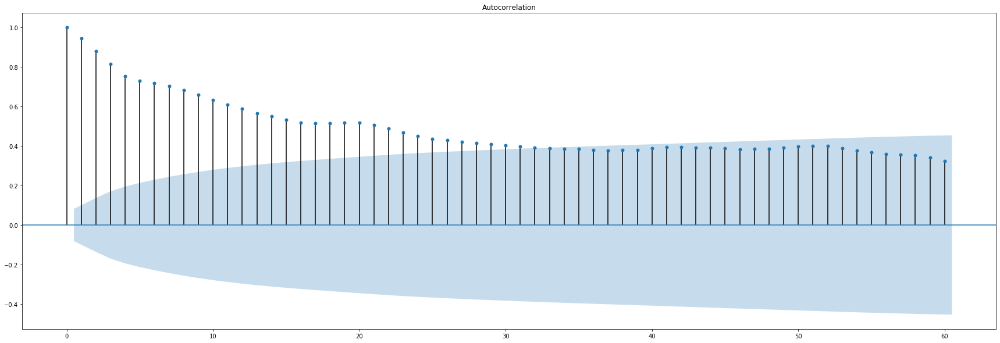

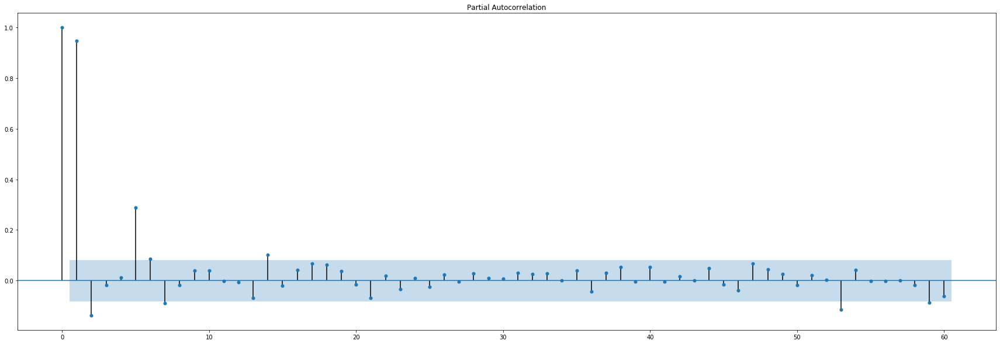

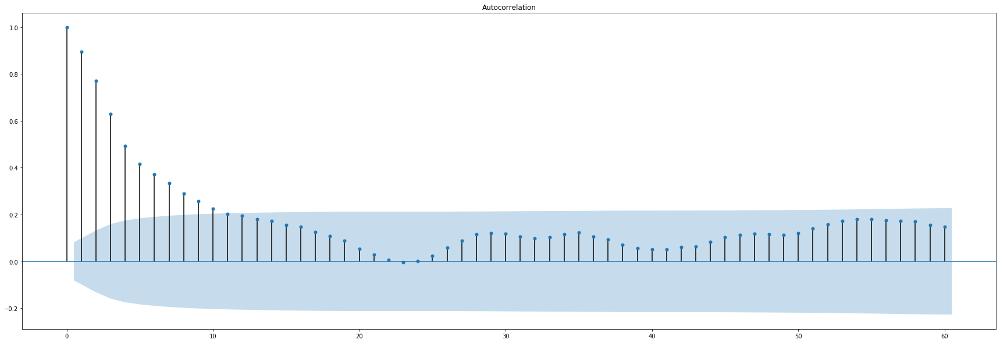

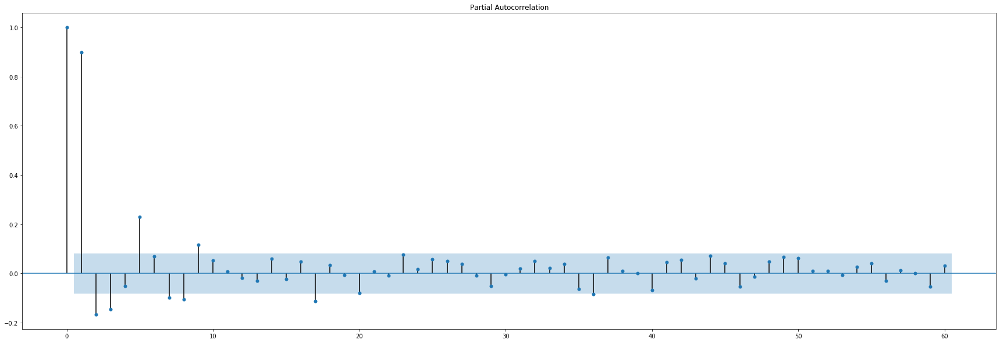

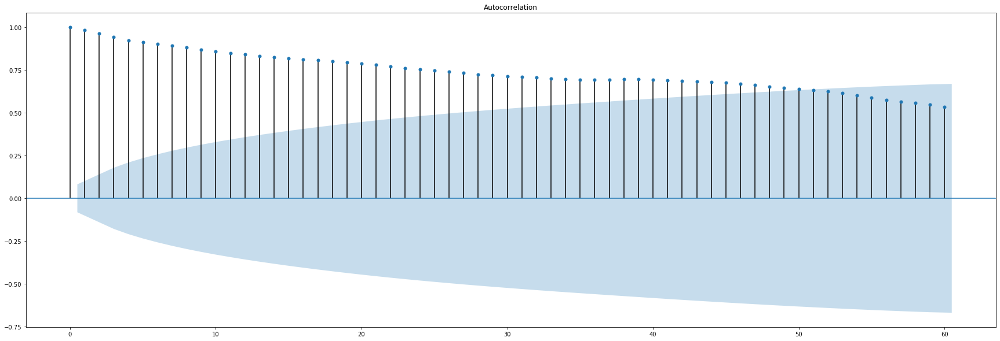

...

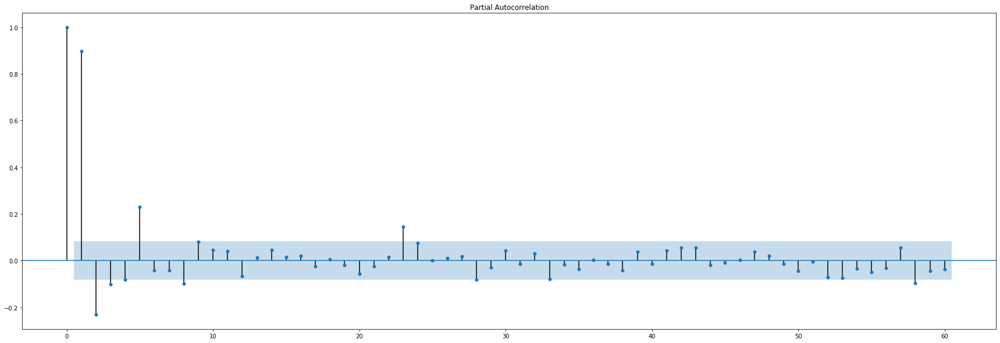

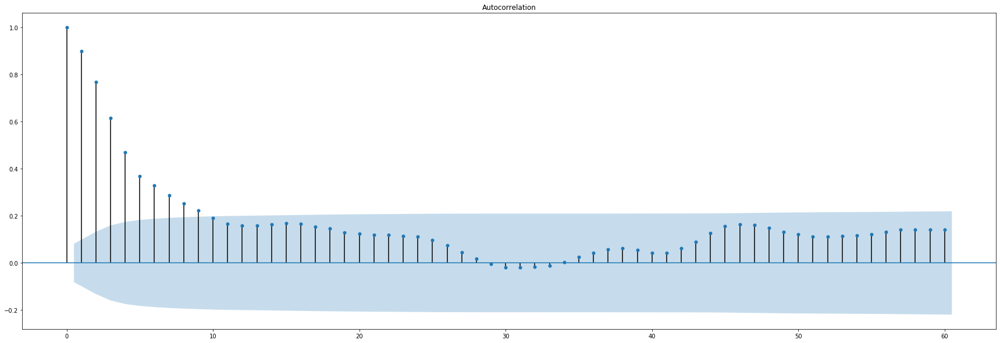

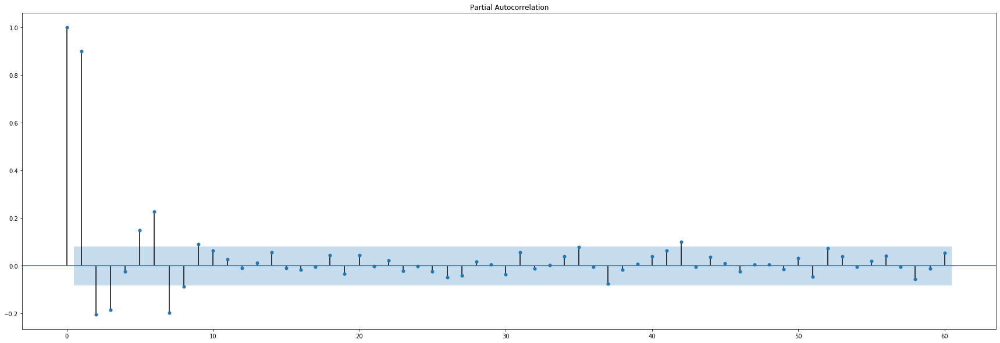

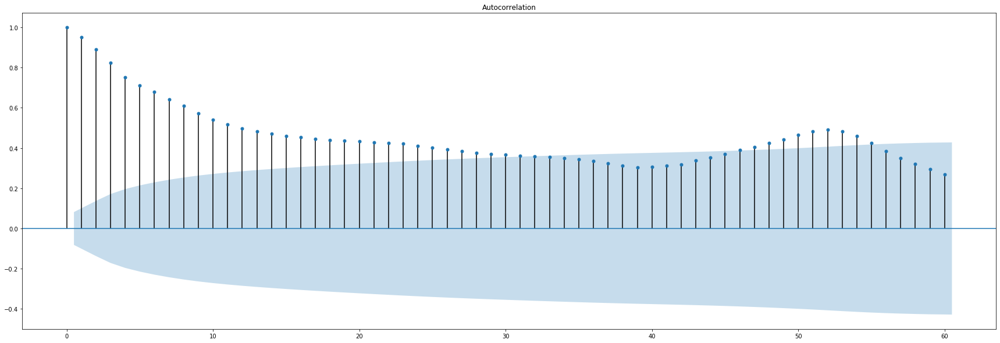

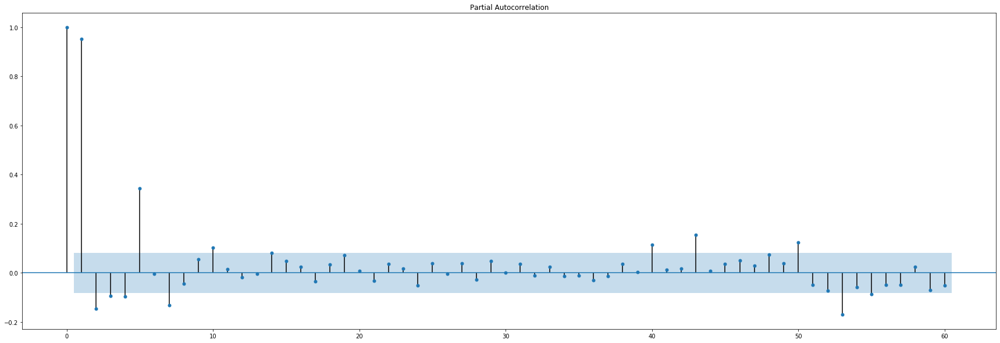

In [176]:
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
import matplotlib as mpl

for i in np.argsort(Y_train)[:,-10:][0]:
    series = pd.DataFrame(np.transpose(np.vstack([Y_train[:,i]])),columns=["Y_train"])
    with mpl.rc_context():
        mpl.rc("figure", figsize=(30,10))
        plot_acf(series,lags=60)
        plot_pacf(series,lags=60)

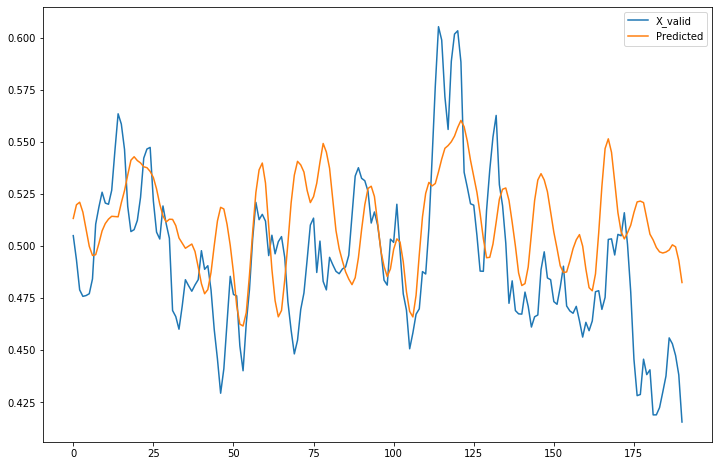

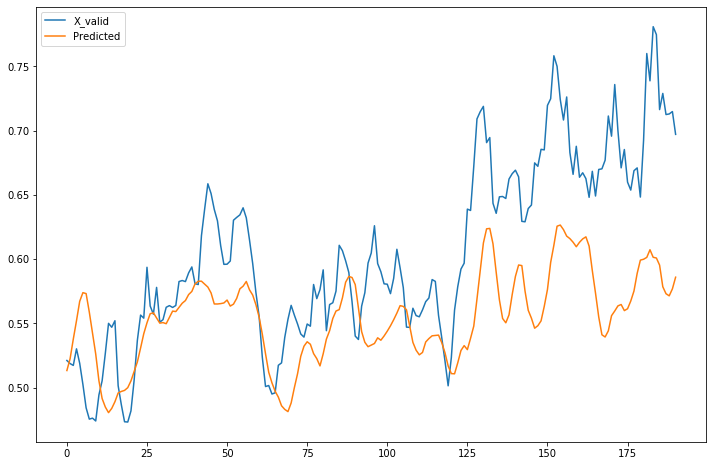

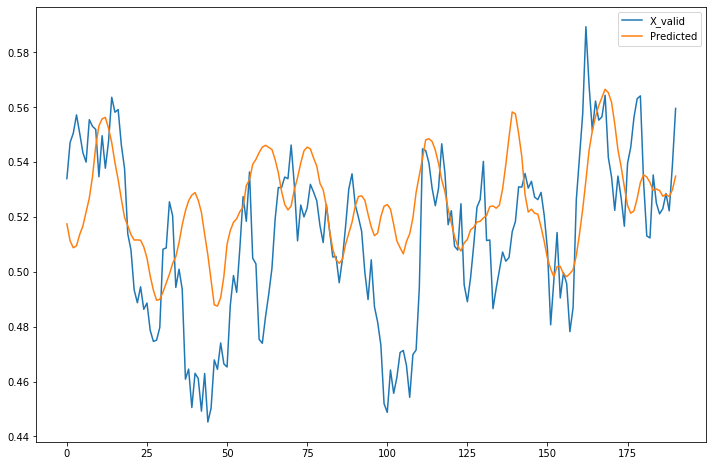

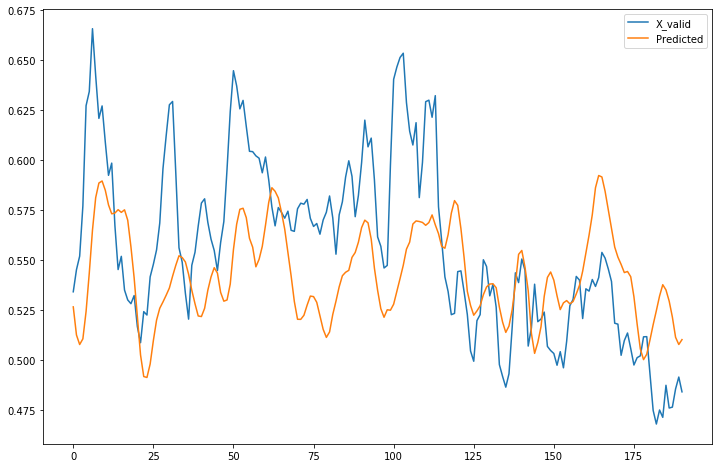

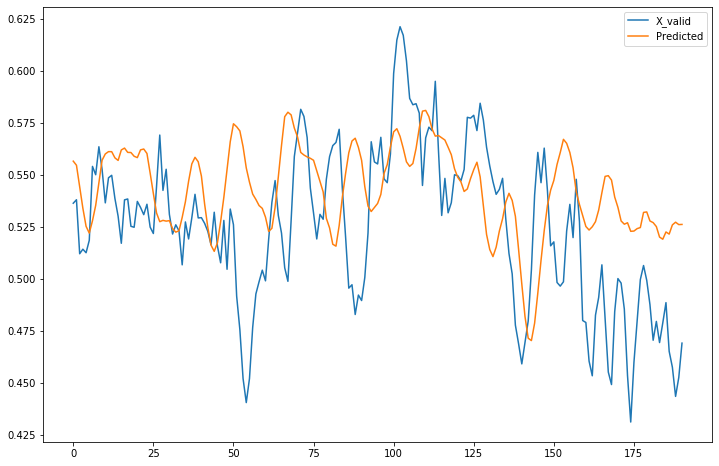

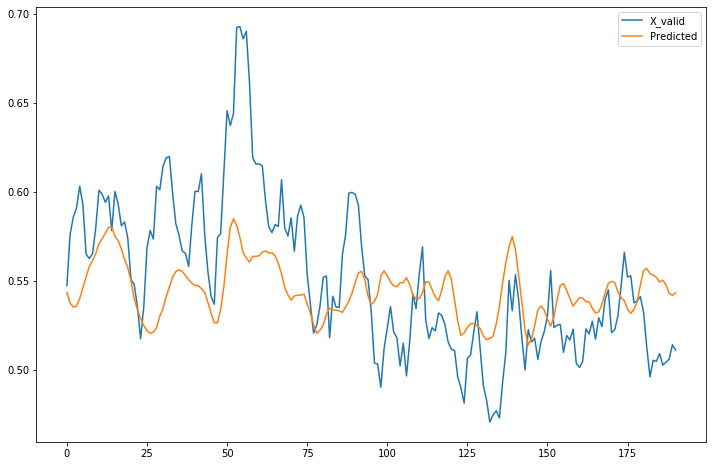

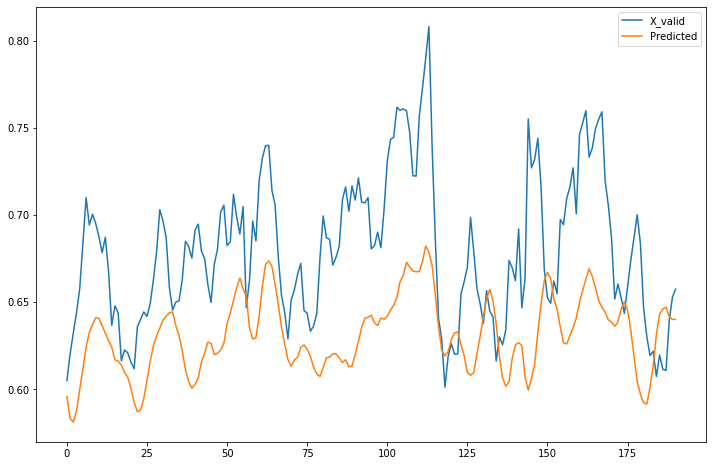

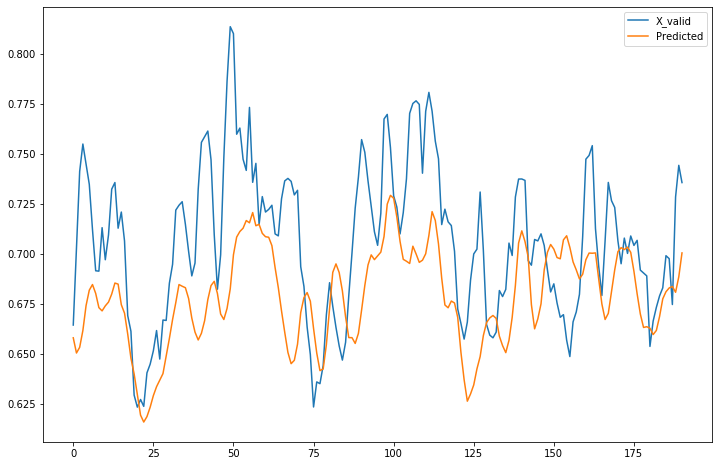

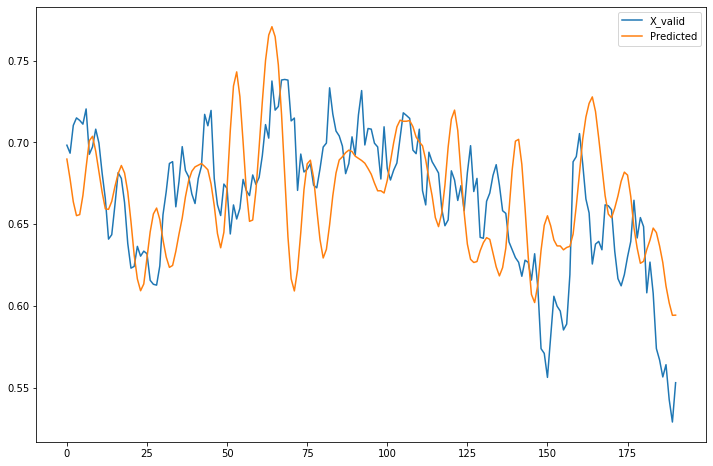

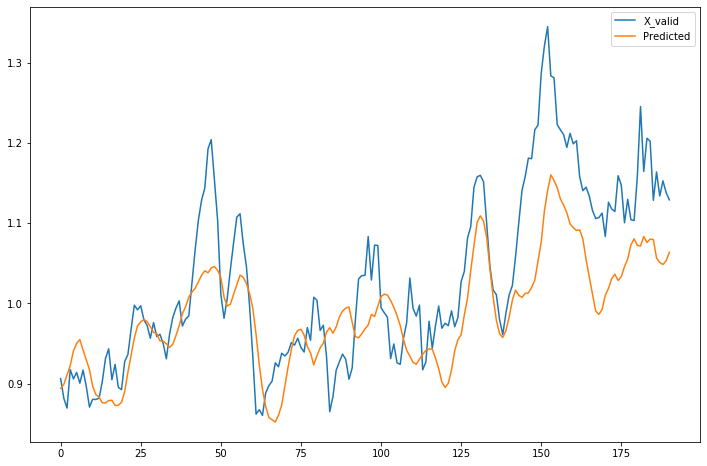

In [177]:
Predict = model.predict(X_valid)
for i in np.argsort(Y_valid)[:,-10:][0]:
    pd.DataFrame(np.transpose(np.vstack([Y_valid[:,i],Predict[:,i]])),columns=["X_valid","Predicted"]).plot(figsize=(12,8))

/home/zhimin90/anaconda3/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/home/zhimin90/anaconda3/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app
/home/zhimin90/anaconda3/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explic

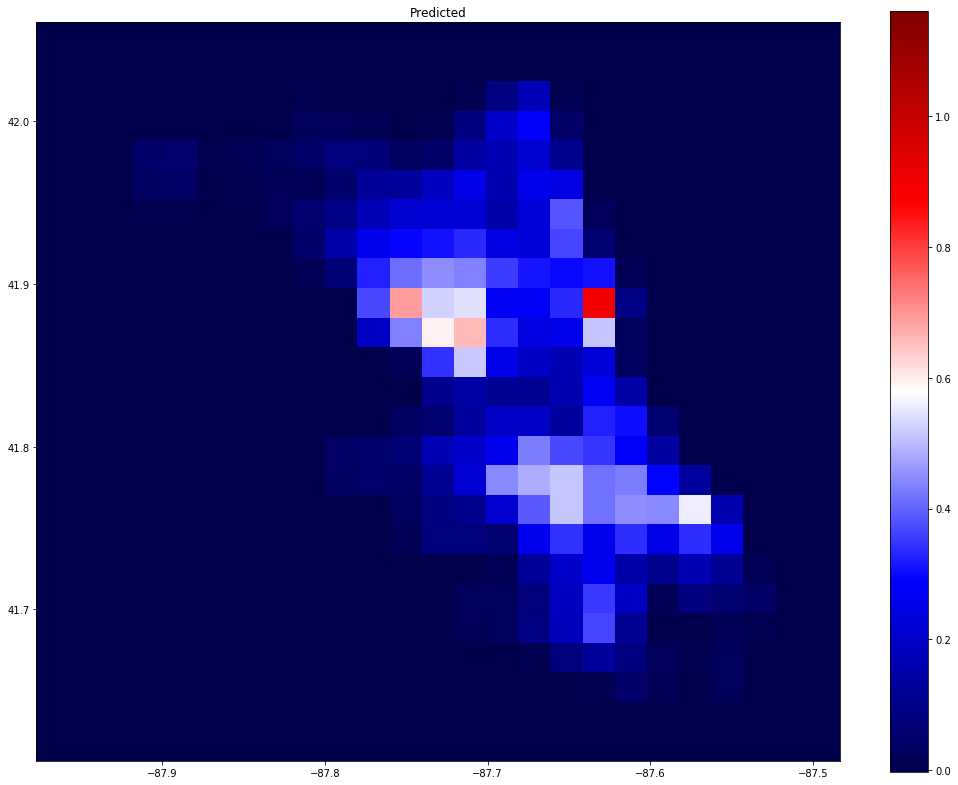

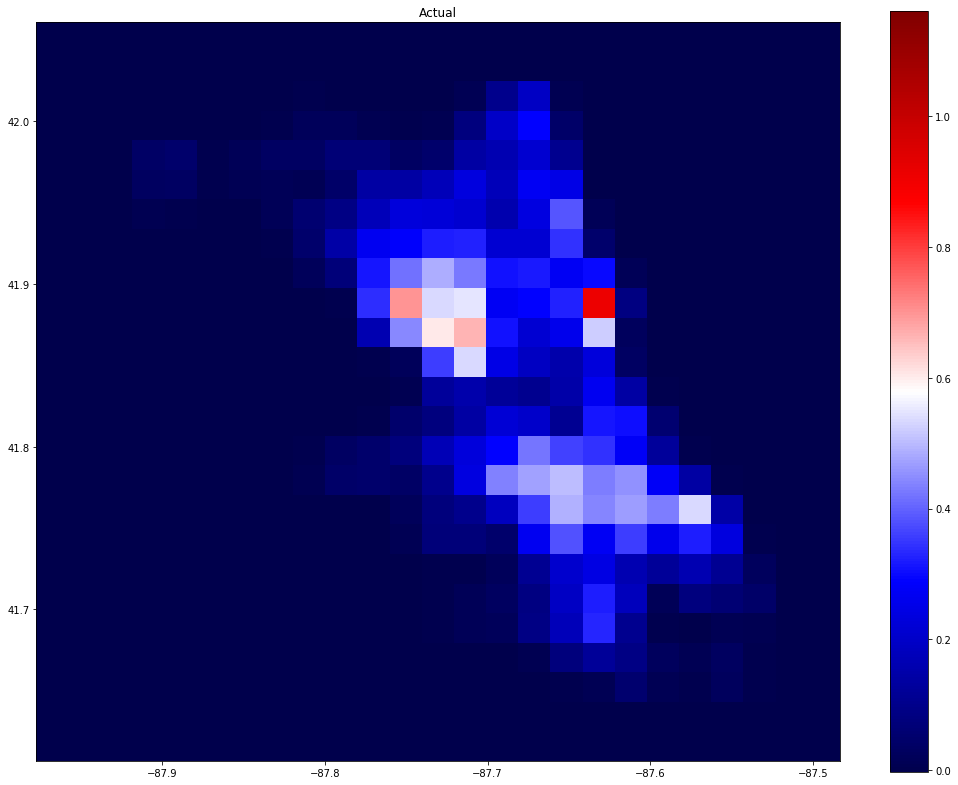

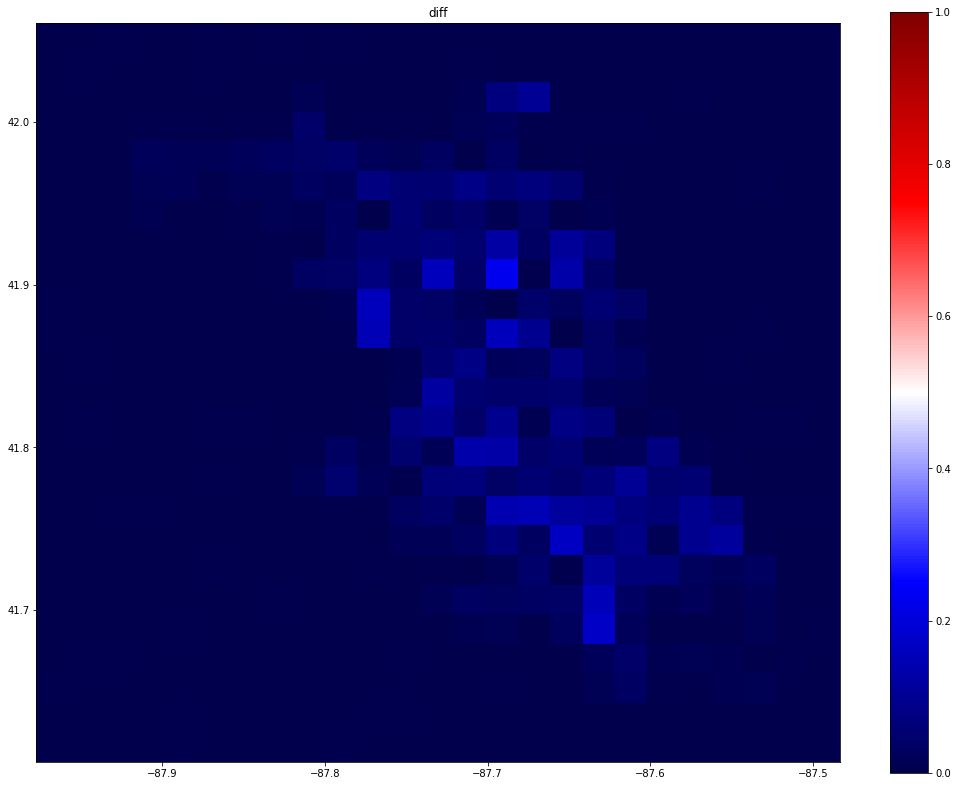

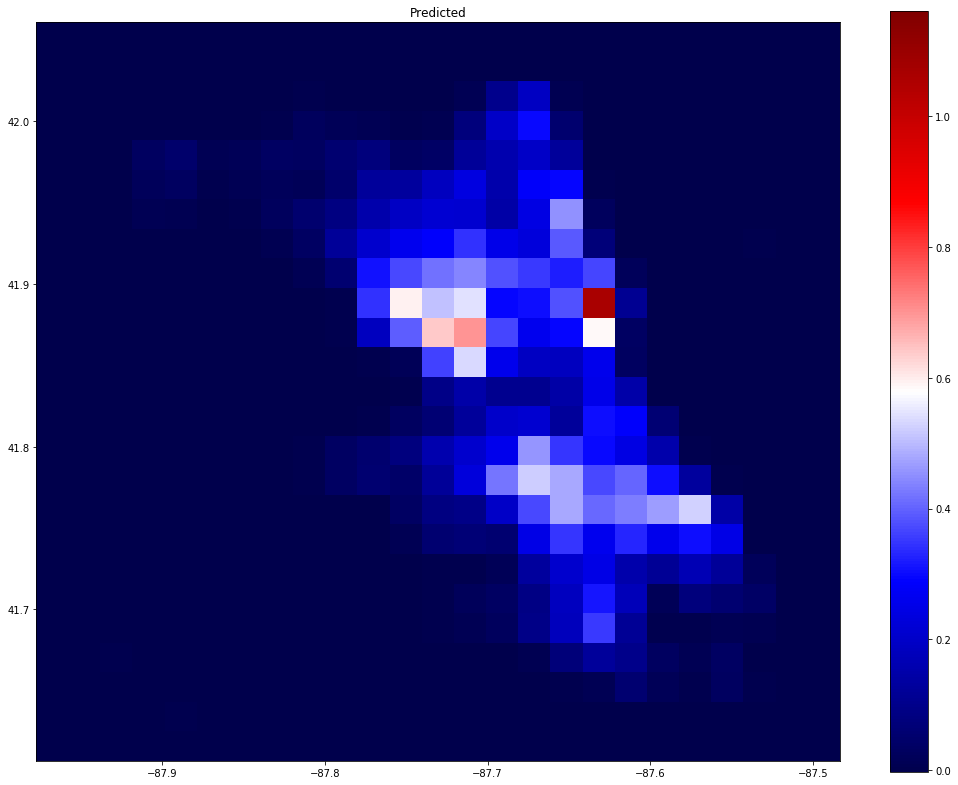

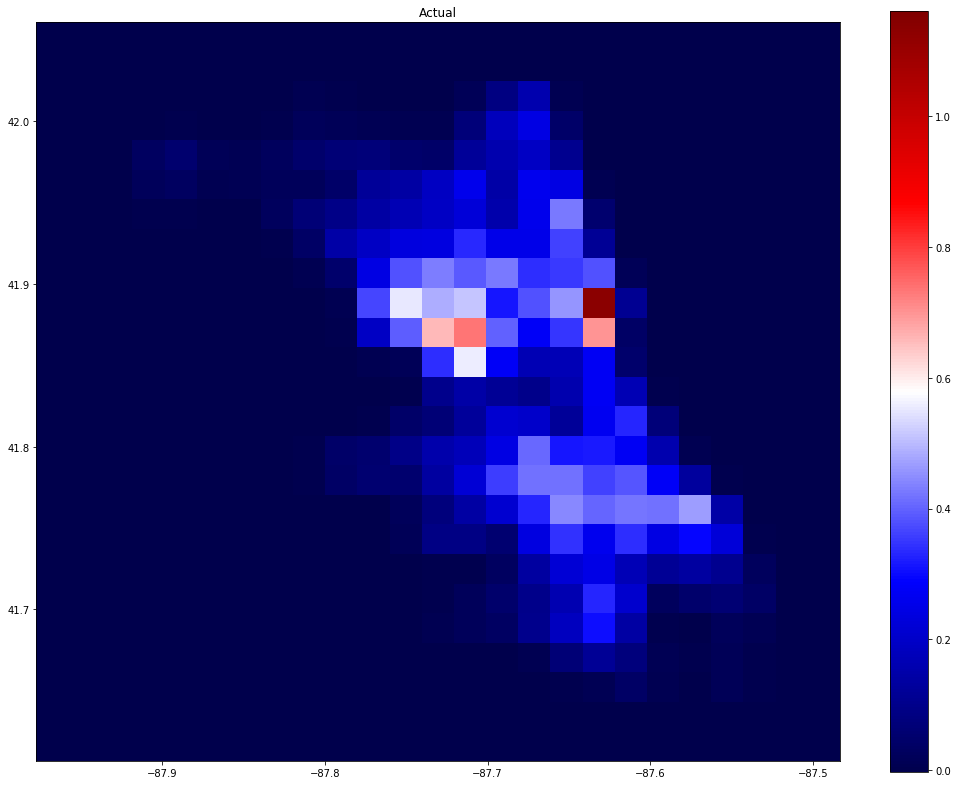

...

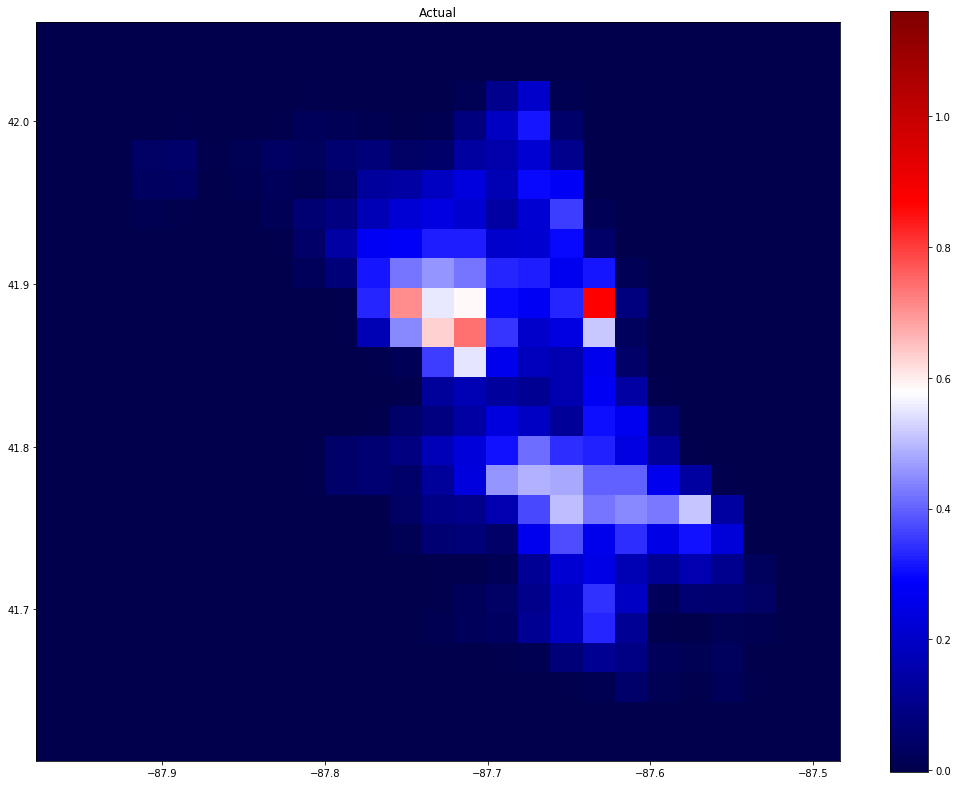

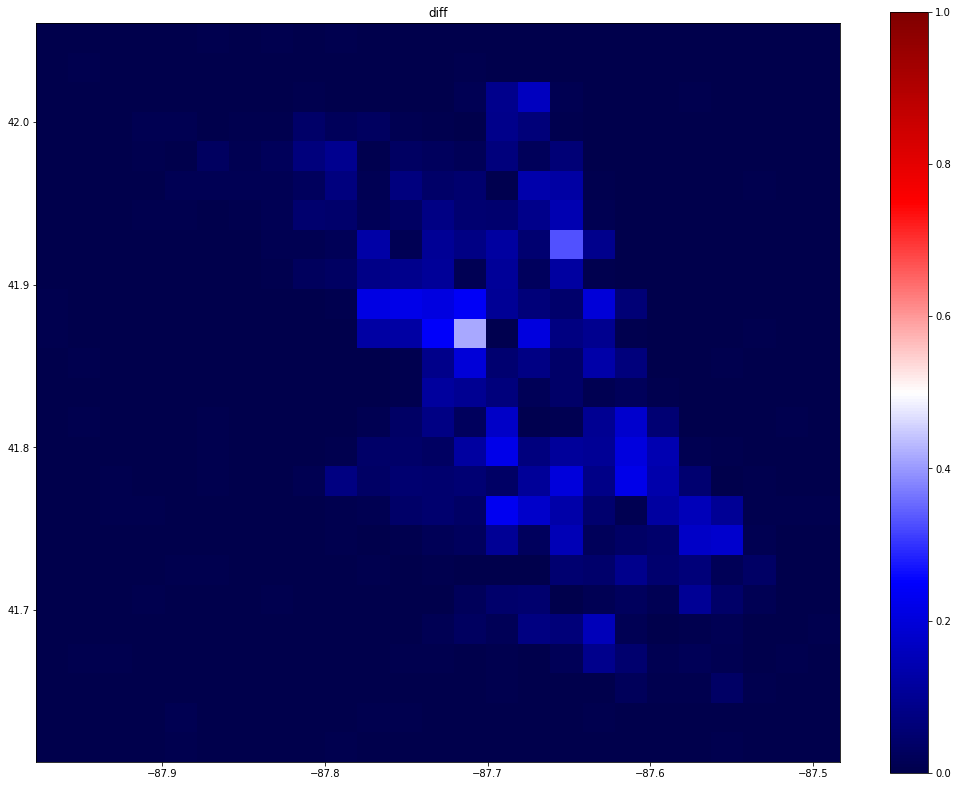

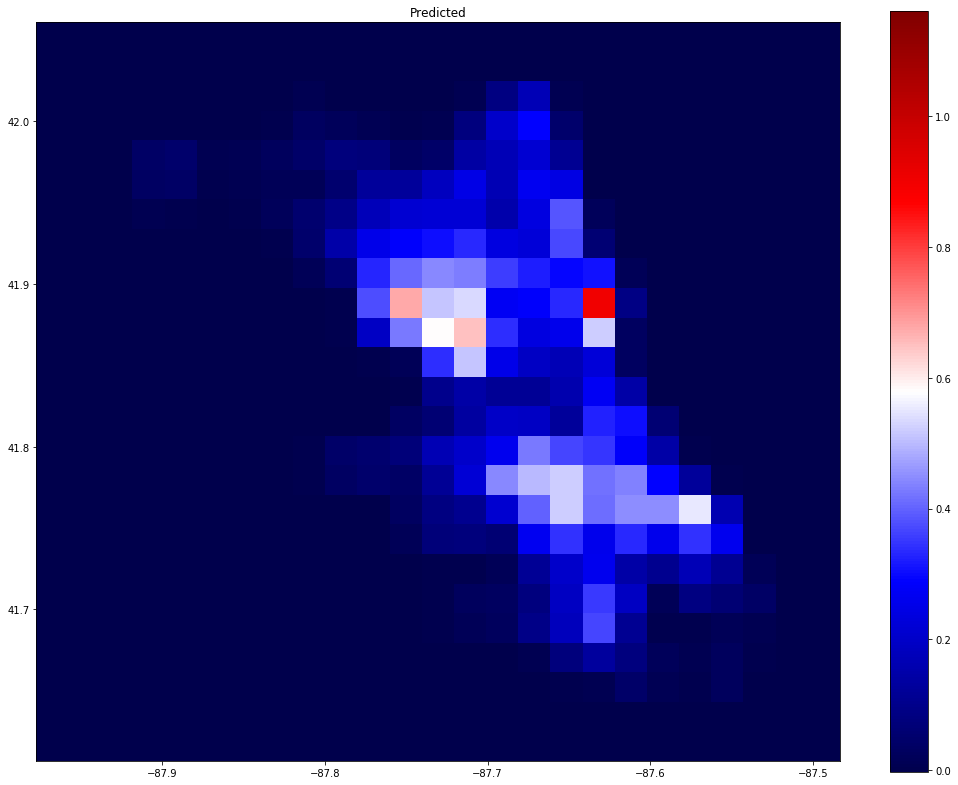

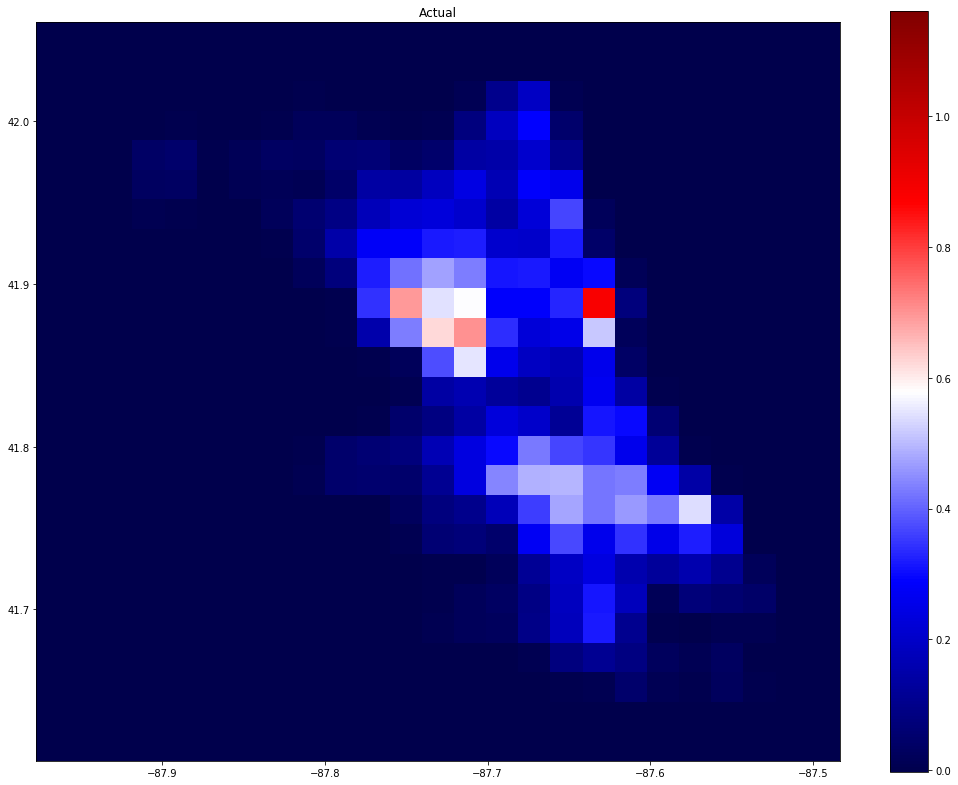

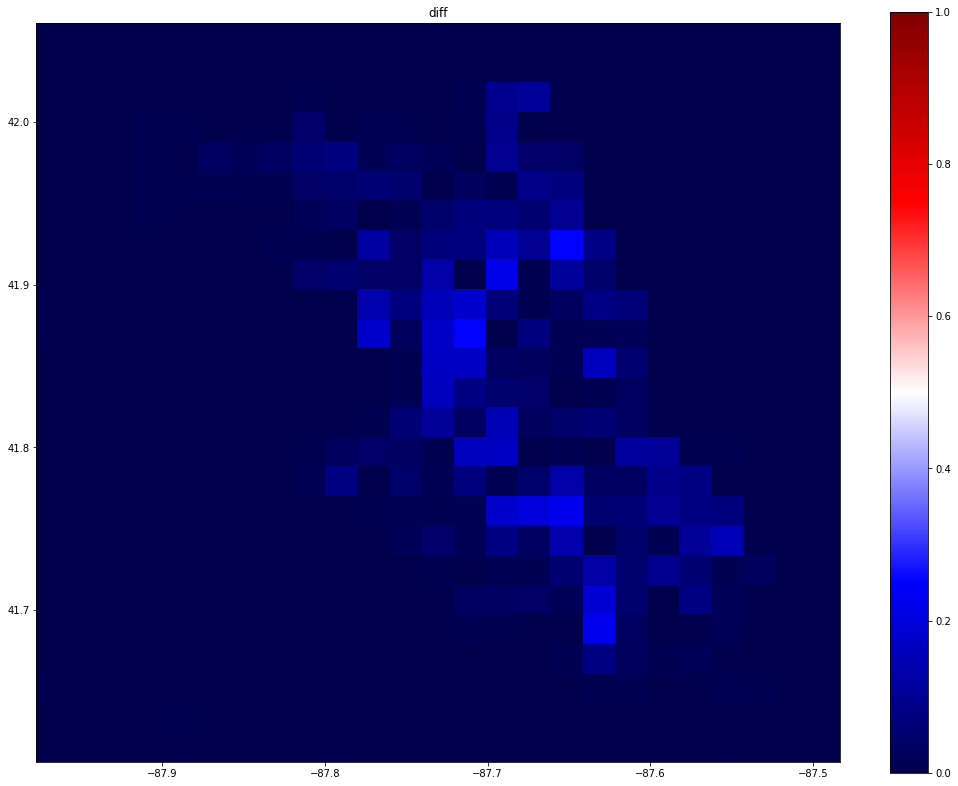

In [178]:
import matplotlib.pyplot as plt
grid_size = 500
density_matrix_t_series = []
# Define the borders
x = [-87.9361,-87.5245]
y = [41.6447,42.023]
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY

for timeStepFromLast in range(Y_valid.shape[0]):
    plt.figure(figsize=(18, 14))
    plt.title('Predicted')
    plt.imshow( X=reshapePred(Predict,timeStepFromLast),vmax=vmax,vmin=vmin, cmap=plt.cm.seismic, extent=[xmin, xmax, ymin, ymax])
    plt.colorbar()
    
    plt.figure(figsize=(18, 14))
    plt.title('Actual')
    plt.imshow( X=reshapePred(Y_valid,timeStepFromLast ),vmax=vmax,vmin=vmin, cmap=plt.cm.seismic, extent=[xmin, xmax, ymin, ymax])
    plt.colorbar()
    
    diff = np.abs(reshapePred(Predict,timeStepFromLast)-reshapePred(Y_valid,timeStepFromLast ))
    plt.figure(figsize=(18, 14))
    plt.title('diff')
    plt.imshow( X=scaleDiff(diff,diff_max,diff_min),vmax=1,vmin=0, cmap=plt.cm.seismic, extent=[xmin, xmax, ymin, ymax])
    plt.colorbar()

#### We plot the single pixel with the most dense in crime KDE

#### We observe the model is simply averaging when change in crime density in volatile

In [179]:
Y_valid[:,i+1][1:]-Y_valid[:,i+1][0:-1]

array([-9.01753809e-04,  1.18319356e-02,  6.39541418e-03, -1.00963813e-03,
        2.21520226e-02,  9.82203294e-03,  8.98862978e-04, -1.40180189e-02,
       -2.85536782e-02, -1.55400392e-02,  2.49836335e-03, -6.25528683e-03,
        6.57367428e-03,  1.52411820e-02, -4.17035312e-03, -3.49904935e-03,
        1.69208642e-02, -6.37871144e-03,  3.80110476e-03,  3.35229609e-02,
        6.12156350e-03,  4.98861189e-04,  3.92699759e-03, -6.97102683e-03,
       -8.97786049e-03,  1.45726198e-02,  3.08736283e-03, -5.16823240e-03,
        4.67295254e-03, -1.55889985e-02, -1.86007998e-02, -5.75143199e-03,
       -4.28169510e-03,  5.93364074e-03,  7.45896358e-03, -3.70727537e-04,
        1.66578132e-02, -1.82307174e-02,  1.18449802e-03,  6.59418153e-03,
       -1.84222292e-02, -1.27048644e-02,  9.62644994e-03, -7.42424322e-03,
        6.96875199e-03,  2.01487532e-02,  3.60732578e-03,  2.75561154e-03,
       -5.55466216e-03, -1.54981214e-02, -1.23346509e-02,  3.42596063e-03,
        1.33056411e-02, -

In [180]:
[Y_valid[:,i+1][1:]-Y_valid[:,i+1][0:-1]
 ,Y_valid[:,i+1][1:]-Y_valid[:,i+1][0:-1]]

[array([-9.01753809e-04,  1.18319356e-02,  6.39541418e-03, -1.00963813e-03,
         2.21520226e-02,  9.82203294e-03,  8.98862978e-04, -1.40180189e-02,
        -2.85536782e-02, -1.55400392e-02,  2.49836335e-03, -6.25528683e-03,
         6.57367428e-03,  1.52411820e-02, -4.17035312e-03, -3.49904935e-03,
         1.69208642e-02, -6.37871144e-03,  3.80110476e-03,  3.35229609e-02,
         6.12156350e-03,  4.98861189e-04,  3.92699759e-03, -6.97102683e-03,
        -8.97786049e-03,  1.45726198e-02,  3.08736283e-03, -5.16823240e-03,
         4.67295254e-03, -1.55889985e-02, -1.86007998e-02, -5.75143199e-03,
        -4.28169510e-03,  5.93364074e-03,  7.45896358e-03, -3.70727537e-04,
         1.66578132e-02, -1.82307174e-02,  1.18449802e-03,  6.59418153e-03,
        -1.84222292e-02, -1.27048644e-02,  9.62644994e-03, -7.42424322e-03,
         6.96875199e-03,  2.01487532e-02,  3.60732578e-03,  2.75561154e-03,
        -5.55466216e-03, -1.54981214e-02, -1.23346509e-02,  3.42596063e-03,
         1.3

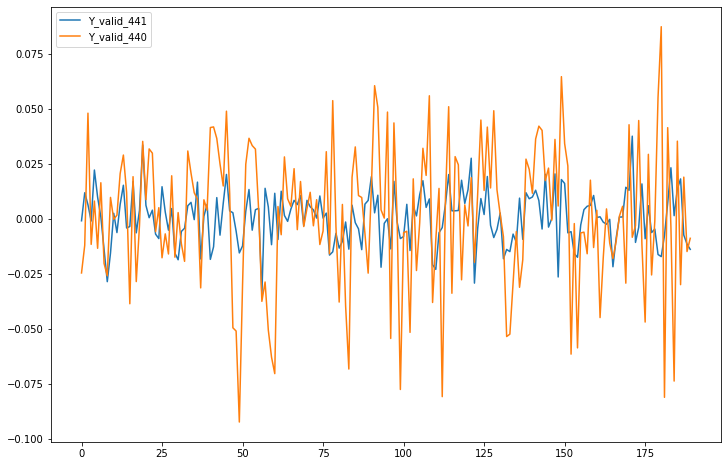

In [181]:
pd.DataFrame(np.transpose(np.vstack([Y_valid[:,i+1][1:]-Y_valid[:,i+1][0:-1],Y_valid[:,i][1:]-Y_valid[:,i][0:-1]])),columns=["Y_valid_"+str(i+1),"Y_valid_"+str(i)]).plot(figsize=(12,8))

In [182]:
for i in range(Predict.shape[0]-1):
    diff_ts = Predict[i,:] - Predict[i+1,:]
    print(np.sum(diff_ts[np.argsort(diff_ts)]))

-0.018348634
-0.016021848
0.015775248
0.020925283
0.045273706
0.03128943
0.018040925
-0.00502263
-0.02631709
-0.013405532
-0.0017083734
-0.013218492
0.0045014173
0.017989665
0.009978518
0.008973703
0.014333576
-0.0049110055
-0.020244107
-0.022466868
-0.040362597
-0.045676887
-0.024351493
0.019487843
0.04735197
0.0633508
0.053164914
0.013827905
-0.019466996
-0.028476924
-0.0130241215
0.02217567
0.04528658
0.046599343
0.03545305
0.0024482757
-0.01050134
-0.009597987
0.004566729
-0.008940145
-0.00509423
-0.005364269
-0.010164425
-0.015671536
-0.0077869743
-0.01051566
-0.049754962
-0.04241468
-0.028206766
-0.0001823008
0.07727072
0.061968148
0.01799655
-0.047201604
-0.07962313
-0.08635062
-0.01418215
0.005559683
0.053069443
0.056287825
0.03908366
-0.0066076815
-0.024781823
-0.035811573
-0.016936183
-0.00874117
0.021601647
0.0020243526
-0.0074737966
-0.008401036
-0.0012931526
0.028078198
0.038011193
0.017500311
0.005063951
-0.025907993
-0.036359817
-0.050627694
0.0023586303
-0.010886669
0.0

#### We plot the difference between prediction and target

In [183]:
diff = (reshapePred(Y_valid,3)-reshapePred(Predict,3))
diff.shape

(25, 25)

In [184]:
diff_max = np.max(diff)
diff_min = np.min(diff)
scaled_diff = (diff - diff_min)/(diff_max - diff_min)

In [185]:
np.max(scaled_diff)

1.0

In [186]:
diff

array([[-1.67235569e-03, -3.23733548e-04,  5.95766352e-04,
        -1.37537951e-04,  1.76841160e-04, -3.81134800e-04,
         2.69784126e-04,  1.77089707e-04,  1.05850736e-03,
         9.53653420e-04,  3.19143641e-04, -2.29958678e-05,
        -2.26227596e-04, -7.21998978e-04,  7.96711422e-04,
         1.71949388e-04,  3.67081026e-04, -2.15561362e-04,
         2.58697488e-04,  5.21506066e-04, -5.16083091e-05,
        -9.78268217e-04, -9.02256346e-04, -1.38947275e-03,
         7.24554178e-04],
       [ 2.90377066e-04,  7.12244539e-04, -4.19916818e-04,
         1.67926308e-04,  9.38627461e-04, -3.83002101e-04,
        -8.67697876e-04, -8.38714186e-06,  8.89419112e-04,
        -3.53584765e-05,  2.69406009e-05, -4.64310055e-04,
         5.50329569e-05, -1.67888240e-03,  1.70630403e-04,
        -2.00605951e-04,  1.23288529e-03, -1.12075359e-05,
         4.61907068e-04, -1.61501090e-03,  3.22510488e-04,
         7.08120642e-04,  1.06346037e-03,  3.36882658e-05,
        -1.00405794e-03],
    

In [187]:
vmax, vmin = np.max(scaled_diff), np.min(scaled_diff)

In [188]:
vmax, vmin 

(1.0, 0.0)

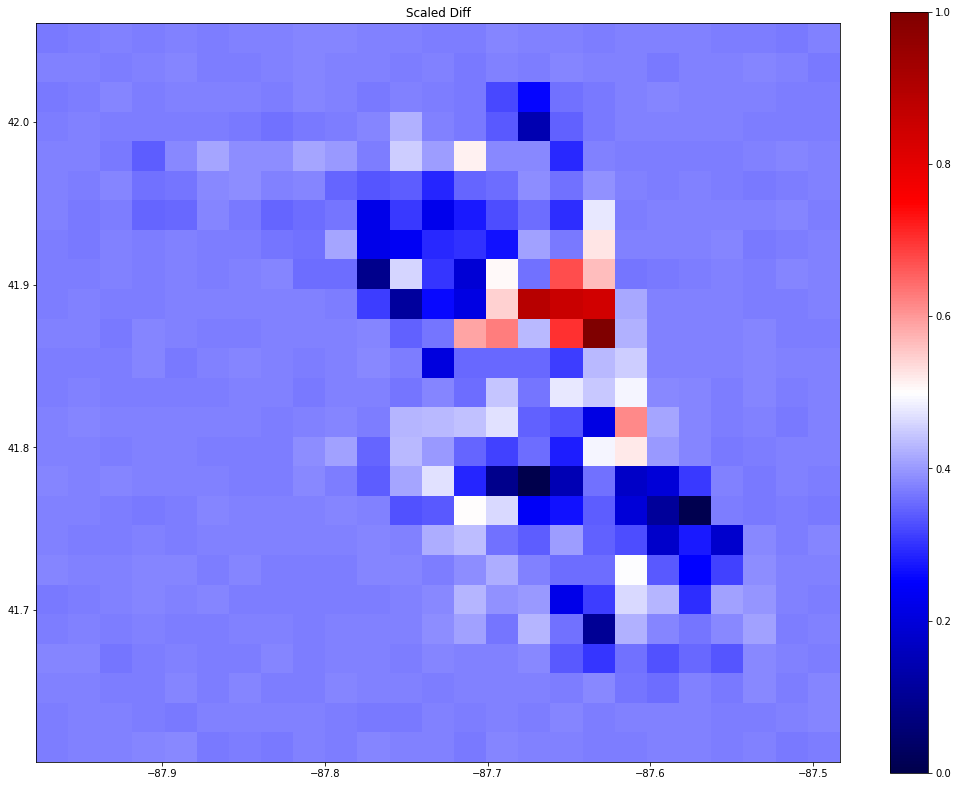

In [190]:
plt.figure(figsize=(18, 14))
plt.title('Scaled Diff')
plt.imshow( X=scaled_diff,vmax=vmax, vmin=vmin, cmap=plt.cm.seismic, extent=[xmin, xmax, ymin, ymax])
plt.colorbar()

#### Note the differences is scaled, red means extreme differences inplot above. Interestingly we see the extreme differences is at the highest crime areas.

#### Tensor Flow test

In [191]:
array1 = np.array([[[0, 1, 2, 3, 4],
   [5, 6, 7, 8, 9]],
  [[10, 11, 12, 13, 14],
   [15, 16, 17, 18, 19]],
  [[20, 21, 22, 23, 24],
   [25, 26, 27, 28, 29]],])

In [192]:
array2 = (array1 + 2)*2

In [193]:
array2

array([[[ 4,  6,  8, 10, 12],
        [14, 16, 18, 20, 22]],

       [[24, 26, 28, 30, 32],
        [34, 36, 38, 40, 42]],

       [[44, 46, 48, 50, 52],
        [54, 56, 58, 60, 62]]])

In [194]:
rank_3_tensor1 = tf.constant(array1)
rank_3_tensor2 = tf.constant(array2)
                    
print(rank_3_tensor1)
print(rank_3_tensor2)

tf.Tensor(
[[[ 0  1  2  3  4]
  [ 5  6  7  8  9]]

 [[10 11 12 13 14]
  [15 16 17 18 19]]

 [[20 21 22 23 24]
  [25 26 27 28 29]]], shape=(3, 2, 5), dtype=int64)
tf.Tensor(
[[[ 4  6  8 10 12]
  [14 16 18 20 22]]

 [[24 26 28 30 32]
  [34 36 38 40 42]]

 [[44 46 48 50 52]
  [54 56 58 60 62]]], shape=(3, 2, 5), dtype=int64)


In [195]:
rank_3_tensor2[0:].shape

TensorShape([3, 2, 5])

In [196]:
rank_3_tensor2 - rank_3_tensor1

<tf.Tensor: shape=(3, 2, 5), dtype=int64, numpy=
array([[[ 4,  5,  6,  7,  8],
        [ 9, 10, 11, 12, 13]],

       [[14, 15, 16, 17, 18],
        [19, 20, 21, 22, 23]],

       [[24, 25, 26, 27, 28],
        [29, 30, 31, 32, 33]]])>

In [197]:
rank_3_tensor2[0:-1] - rank_3_tensor2[1:]

<tf.Tensor: shape=(2, 2, 5), dtype=int64, numpy=
array([[[-20, -20, -20, -20, -20],
        [-20, -20, -20, -20, -20]],

       [[-20, -20, -20, -20, -20],
        [-20, -20, -20, -20, -20]]])>

In [198]:
tf.math.subtract(rank_3_tensor2[0:-1],rank_3_tensor2[1:])

<tf.Tensor: shape=(2, 2, 5), dtype=int64, numpy=
array([[[-20, -20, -20, -20, -20],
        [-20, -20, -20, -20, -20]],

       [[-20, -20, -20, -20, -20],
        [-20, -20, -20, -20, -20]]])>

## 1 lag diff LSTM

In [206]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))  
timeDist = TimeDistributed(Flatten())(inputs)
print(timeDist.shape)
diffTime = Lambda(lambda x: x[:,:-1,:]-x[:,1:,:],name='timestep_diff')(timeDist)
print(diffTime.shape)
LSTM_layer1 = LSTM(1000, return_sequences=True)(timeDist)
LSTM_layer2 = LSTM(1000, return_sequences=True)(LSTM_layer1)
LSTM_layer3 = LSTM(1000)(LSTM_layer2)
#Dense1 = Dense(1000, kernel_initializer='glorot_normal', activation='relu')(LSTM_layer2)
Dense2 = Dense(Y_train.shape[1])(LSTM_layer3)
outputs = Dense2

model = Model(inputs, outputs, name="Flattened_diff1lag_LTSM")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',#'mean_squared_logarithmic_error',
                   metrics=['mae'], 
                   optimizer=adam)



(None, 52, 625)
(None, 51, 625)
Model: "Flattened_diff1lag_LTSM"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_73 (InputLayer)        [(None, 52, 25, 25, 1)]   0         
_________________________________________________________________
time_distributed_127 (TimeDi (None, 52, 625)           0         
_________________________________________________________________
lstm_35 (LSTM)               (None, 52, 1000)          6504000   
_________________________________________________________________
lstm_36 (LSTM)               (None, 52, 1000)          8004000   
_________________________________________________________________
lstm_37 (LSTM)               (None, 1000)              8004000   
_________________________________________________________________
dense_258 (Dense)            (None, 625)               625625    
Total params: 23,137,625
Trainable params: 23,137,625
Non-trainable params: 0

## LSTM Attention

In [228]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

epochs = 100
lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'


inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

#send both convolved layer and flattened layer into LSTM
timeDist = TimeDistributed(Flatten())(inputs)
#diffTime = Lambda(lambda x: x[:,:-1,:]-x[:,1:,:],name='timestep_diff')(timeDist)

units = 1000
LSTM_layer1 = LSTM(units, return_sequences=True)(timeDist)
LSTM_layer2 = LSTM(units, return_sequences=True)(LSTM_layer1)
LSTM_layer3 = LSTM(units, return_sequences=True)(LSTM_layer2)

attention = Dense(units*10, activation='tanh')(LSTM_layer3) ## weight matrix W (= units x units)
attention = Dense(1, activation='linear')(attention)     ## weight matrix v (= units x 1)
attention = Flatten()(attention)
attention = Activation('softmax',name='attention_weights')(attention)
attention = RepeatVector(units)(attention)
attention = Permute([2, 1])(attention)

sent_representation = Multiply()([LSTM_layer3, attention])
attended_LSTM_out = Lambda(lambda x : K.sum(x, axis=1))(sent_representation) ## this line
D_temp = Dense(units*10, activation='relu')(attended_LSTM_out) # hidden layer

#Flatten time dimension
Dense2 = Dense(Y_train.shape[1])(D_temp)
outputs = Dense2

model = Model(inputs, outputs, name="FLATTENED_LTSM_Attention")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)

Model: "FLATTENED_LTSM_Attention"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_78 (InputLayer)           [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_132 (TimeDistr (None, 52, 625)      0           input_78[0][0]                   
__________________________________________________________________________________________________
lstm_50 (LSTM)                  (None, 52, 1000)     6504000     time_distributed_132[0][0]       
__________________________________________________________________________________________________
lstm_51 (LSTM)                  (None, 52, 1000)     8004000     lstm_50[0][0]                    
___________________________________________________________________________

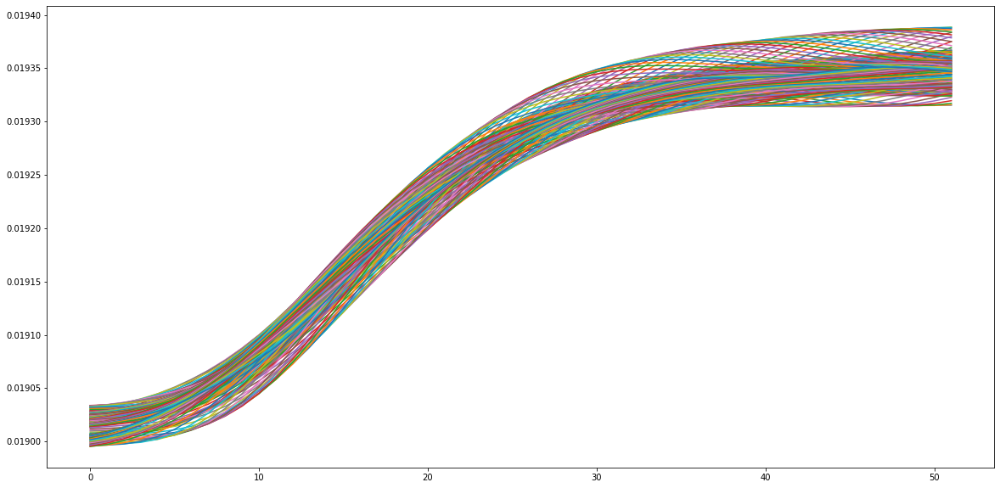

In [229]:
model_AttentionOut = model  # include here your original model

layer_name = 'attention_weights'
intermediate_layer_model = Model(inputs=model_AttentionOut.input,
                                 outputs=model_AttentionOut.get_layer(layer_name).output)
plt.figure(figsize=(20,10))

for timeStepWeek in range(X_valid.shape[0]):
    intermediate_output = intermediate_layer_model.predict(X_valid[timeStepWeek:timeStepWeek+1])
    plt.plot(intermediate_output[0])
    #plt.show()

In [ ]:
EPOCHS = 5

earlystop_callback = tf.keras.callbacks.EarlyStopping(monitor="val_loss",
    min_delta=0,
    patience=EPOCHS*5,
    verbose=1,
    mode="auto",
    baseline=None,
    restore_best_weights=True,)

logdir = os.path.join("./logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_cbk = tf.keras.callbacks.TensorBoard(log_dir=logdir)

modelfilename = checkpoint_filepath + '_'+\
                    datetime.datetime.now().strftime("%Y%m%d-%H%M%S")\
                    + "_model.hdf5"

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    modelfilename,
    save_weights_only=False,
    monitor='val_loss',#'val_accuracy',
    mode='min',
    verbose=1,
    period = 1,
    save_best_only=True)


model.summary()

model_history = model.fit(X_train,Y_train, 
                             validation_data=(X_valid, Y_valid),
                             epochs=1000, 
                             batch_size=21, 
                             callbacks=[tensorboard_cbk,
                             #hp.KerasCallback(logdir, hparams),
                             earlystop_callback,
                             model_checkpoint_callback
                                       ])

valid_loss, valid_acc = model.evaluate(X_valid, Y_valid, verbose=2) # 5/2020 nt: use validation set
print ("valid_accuracy_MAE=%s, valid_loss=%s" % (valid_acc, valid_loss))

Model: "FLATTENED_LTSM_Attention"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_78 (InputLayer)           [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_132 (TimeDistr (None, 52, 625)      0           input_78[0][0]                   
__________________________________________________________________________________________________
lstm_50 (LSTM)                  (None, 52, 1000)     6504000     time_distributed_132[0][0]       
__________________________________________________________________________________________________
lstm_51 (LSTM)                  (None, 52, 1000)     8004000     lstm_50[0][0]                    
___________________________________________________________________________

In [ ]:
Predict = model.predict(X_valid)
for i in np.argsort(Y_valid)[:,-20:][0]:
    pd.DataFrame(np.transpose(np.vstack([Predict[:,i],Y_valid[:,i]])),columns=["Predicted","X_valid"]).plot(figsize=(12,8))

In [ ]:
for i in range(Predict.shape[0]-1):
    diff_ts = Predict[i,:] - Predict[i+1,:]
    print(np.sum(diff_ts[np.argsort(diff_ts)]))